# **Boston Crimes Analysis**
The following is an analysis of the crimes in Boston (Massachusetts) from June 14, 2015 until September 3, 2018.   
  
   
The dataset is provided by the Boston Police Department (BPD) and contais *records* from the new crime incident report system, which includes a reduced set of fields focused on capturing the *type* of incident as well as *when* and *where* it occurred.

We start the analysis by importing all the libraries that we need:

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import warnings
import folium
from folium.plugins import HeatMap
from branca.element import Template, MacroElement
from folium import Figure
import plotly.express as px
import plotly.graph_objects as go
from branca.element import Template, MacroElement
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from folium import GeoJson
from IPython.display import display, HTML
from scipy.stats import chi2_contingency


warnings.simplefilter(action='ignore', category=FutureWarning)

Let's import the CSV File:

In [26]:
file_path = './crime.csv'

crimes = pd.read_csv(file_path, encoding='ISO-8859-1')

file_path = './offense_codes.csv'

offense_codes = pd.read_csv(file_path, encoding='ISO-8859-1')

print(crimes.head(10))

  INCIDENT_NUMBER  OFFENSE_CODE               OFFENSE_CODE_GROUP  \
0      I182070945           619                          Larceny   
1      I182070943          1402                        Vandalism   
2      I182070941          3410                            Towed   
3      I182070940          3114             Investigate Property   
4      I182070938          3114             Investigate Property   
5      I182070936          3820  Motor Vehicle Accident Response   
6      I182070933           724                       Auto Theft   
7      I182070932          3301                  Verbal Disputes   
8      I182070931           301                          Robbery   
9      I182070929          3301                  Verbal Disputes   

                          OFFENSE_DESCRIPTION DISTRICT REPORTING_AREA  \
0                          LARCENY ALL OTHERS      D14            808   
1                                   VANDALISM      C11            347   
2                         TOWED 

The dataset is complemented by an additional dataset that provides a mapping between OFFENSE_CODE and their respective names.  

We'll proceed by analyzing which crimes are in the second dataset.

In [27]:
unique_codes = offense_codes['CODE'].unique()

unique_offense_codes = crimes['OFFENSE_CODE'].unique()

set_codes = set(unique_codes)
set_offense_codes = set(unique_offense_codes)

if set_offense_codes.issubset(set_codes):
    print("All values in 'unique_offense_codes' are present in 'unique_codes'.")
else:
    print("Some values in 'unique_offense_codes' are not present in 'unique_codes'.")

All values in 'unique_offense_codes' are present in 'unique_codes'.


It can be denoted that 222 out of 425 possible crimes are in the dataset, so  we will just substitute the code of the crime with its name using the complementary dataset.

In [28]:
code_to_name_mapping = offense_codes.set_index('CODE')['NAME'].to_dict()
crimes['OFFENSE_NAME'] = crimes['OFFENSE_CODE'].map(code_to_name_mapping)

print(crimes.head())

  INCIDENT_NUMBER  OFFENSE_CODE    OFFENSE_CODE_GROUP   OFFENSE_DESCRIPTION  \
0      I182070945           619               Larceny    LARCENY ALL OTHERS   
1      I182070943          1402             Vandalism             VANDALISM   
2      I182070941          3410                 Towed   TOWED MOTOR VEHICLE   
3      I182070940          3114  Investigate Property  INVESTIGATE PROPERTY   
4      I182070938          3114  Investigate Property  INVESTIGATE PROPERTY   

  DISTRICT REPORTING_AREA SHOOTING     OCCURRED_ON_DATE  YEAR  MONTH  \
0      D14            808      NaN  2018-09-02 13:00:00  2018      9   
1      C11            347      NaN  2018-08-21 00:00:00  2018      8   
2       D4            151      NaN  2018-09-03 19:27:00  2018      9   
3       D4            272      NaN  2018-09-03 21:16:00  2018      9   
4       B3            421      NaN  2018-09-03 21:05:00  2018      9   

  DAY_OF_WEEK  HOUR    UCR_PART       STREET        Lat       Long  \
0      Sunday    13   

Now, 'crimes' contains a new column 'OFFENSE_NAME' with the corresponding names.

We will now check the ***latitude*** and ***longitude*** values for the crimes within the graph. From the coordinates, it is possible to see the exact location where the crime was recorded.  

The objective is to verify that all crimes were recorded in the Boston area and to identify possible extreme values (outliers)

In [29]:
lat_stats = crimes['Lat'].describe()
long_stats = crimes['Long'].describe()
combined_stats = pd.DataFrame({'Lat': lat_stats, 'Long': long_stats})

combined_stats

,Lat,Long
count,299074.000000,299074.000000
mean,42.214381,-70.908272
std,2.159766,3.493618
min,-1.000000,-71.178674
25%,42.297442,-71.097135
50%,42.325538,-71.077524
75%,42.348624,-71.062467
max,42.395042,-1.000000


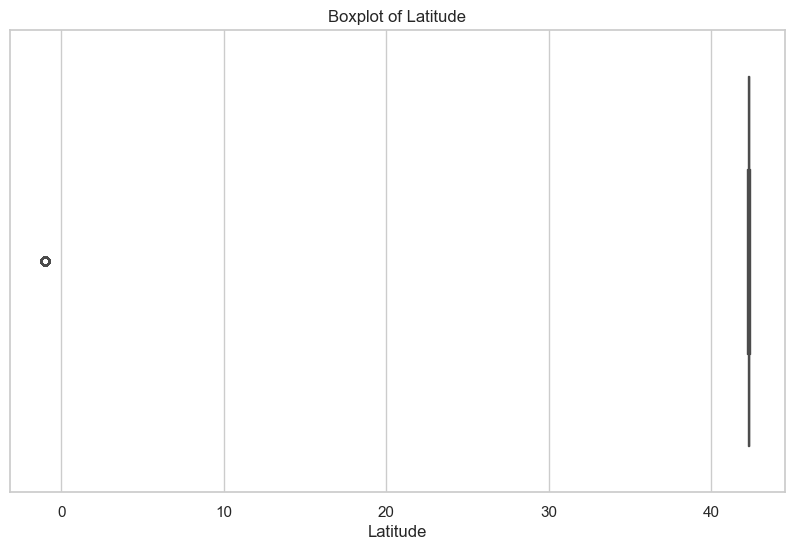

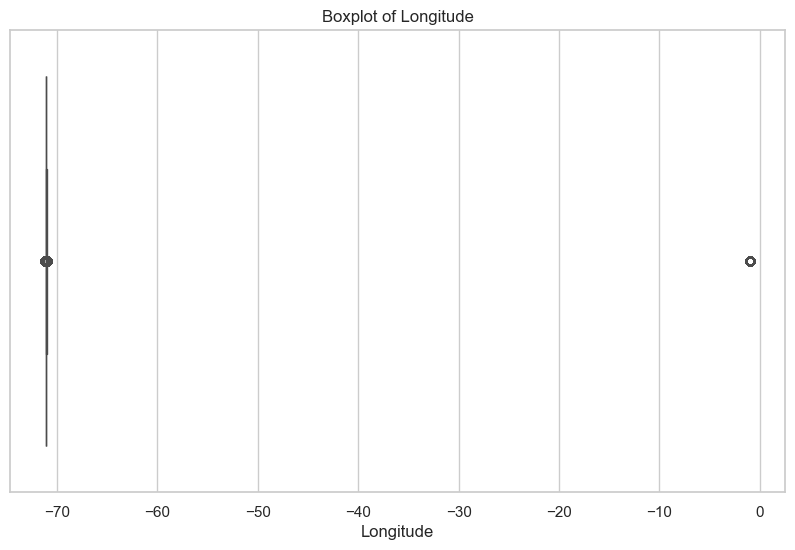

In [30]:
sns.set(style="whitegrid")

# Boxplot for Latitude
plt.figure(figsize=(10, 6))
sns.boxplot(x=crimes['Lat'])
plt.title('Boxplot of Latitude')
plt.xlabel('Latitude')
plt.show()

# Boxplot for Longitude
plt.figure(figsize=(10, 6))
sns.boxplot(x=crimes['Long'])
plt.title('Boxplot of Longitude')
plt.xlabel('Longitude')
plt.show()


As we can see from the graph, the value 1/-1 is outside the range of Boston coordinates. 
We continue by removing the values for both Lat and Long columns in order to better visualize the data and have a better analysis:

In [31]:
crimes = crimes[crimes['Lat'] != -1]
crimes = crimes[crimes['Long'] != -1]

We can see a single outlier on latitude that is at -1. Longitude instead seems to show also other outliers

Let's plot the distribution graphs:

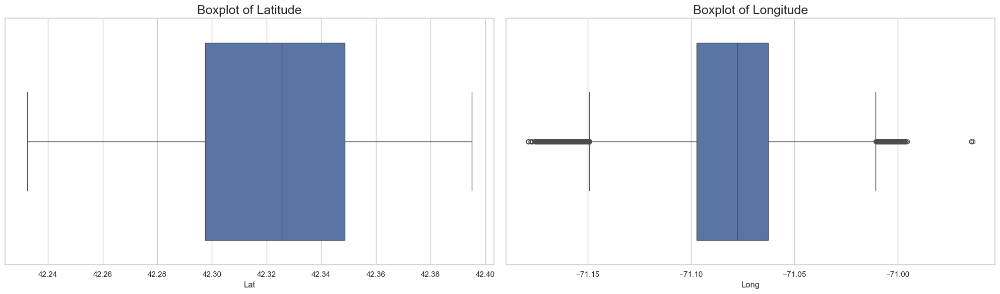

In [32]:
sns.set(style="whitegrid")
fig, axs = plt.subplots(ncols=2, figsize=(20, 6))

# Boxplot for Latitude
sns.boxplot(x=crimes['Lat'], ax=axs[0])
axs[0].set_title('Boxplot of Latitude', fontsize=18)

# Boxplot for Longitude
sns.boxplot(x=crimes['Long'], ax=axs[1])
axs[1].set_title('Boxplot of Longitude', fontsize=18)

plt.tight_layout()
plt.show()

As we saw from the previous analysis, Longitude also has values that are apparently "Outliers". Let's analyze them:

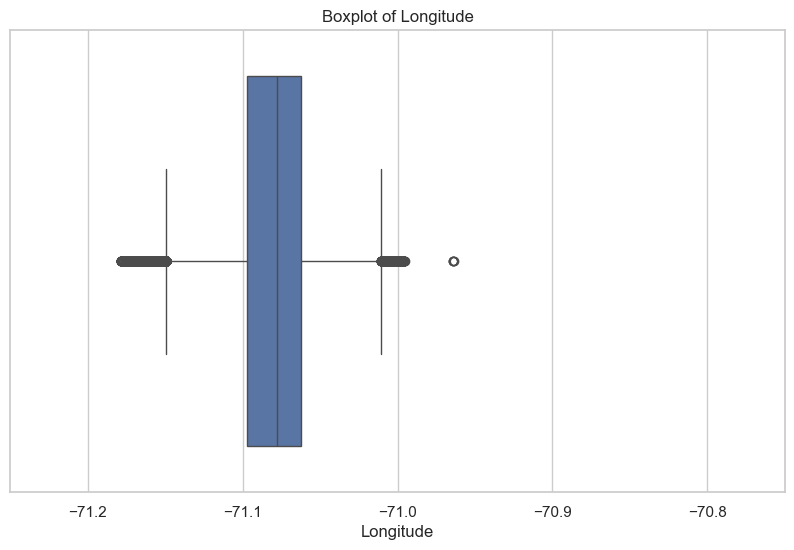

In [33]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=crimes['Long'])
plt.title('Boxplot of Longitude')
plt.xlabel('Longitude')
plt.xlim(-71.25, -70.75)  # Setting the x-axis range to (-72, -70)
plt.show()

Are the outliers in Longitude really wrong values? We plot them in the map.

In [34]:
Q1 = crimes['Long'].quantile(0.25)
Q3 = crimes['Long'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = crimes[(crimes['Long'] < lower_bound) | (crimes['Long'] > upper_bound)]

In [35]:
map_center = [crimes['Lat'].mean(), crimes['Long'].mean()]
crime_map = folium.Map(location=map_center, zoom_start=11, min_zoom=11, max_zoom=11)

# Create and add a HeatMap layer
heat_data = [[row['Lat'], row['Long']] for index, row in outliers.iterrows()]
HeatMap(heat_data, radius=10).add_to(crime_map)

# Create a custom legend as HTML
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            top: 50px; left: 50px; width: 120px; height: 100px; 
            border:2px solid grey; z-index:9999; font-size:14px; background:white;
            padding: 5px; border-radius: 3px; display: flex; align-items: center;">
    <div style="background: linear-gradient(to top, red, yellow, green, lightblue); 
                width: 20px; height: 50px; margin-right: 5px;"></div>
    <div>
        <div style="color: #333; font-size: 12px; text-align: left; margin-bottom: 30px; font-weight: bold;">
            Low Density
        </div>
        <div style="color: #333; font-size: 12px; text-align: left; font-weight: bold;">
            High Density
        </div>
    </div>
</div>
{% endmacro %}
"""

# Add the legend to the map
macro = MacroElement()
macro._template = Template(template)
crime_map.get_root().add_child(macro)

with open('./NEW_City_Council_Districts_-_May_2023_Approved_Plan.geojson', 'r') as f:
    boston_geo = f.read()

# Create a GeoJson object and add it to the map
GeoJson(
    boston_geo,
    style_function=lambda x: {'fillColor': 'transparent', 'color': 'red', 'weight': 2}
).add_to(crime_map)

crime_map

Overlayed on the heatmap, we plotted the recognized Boston City Council Districts, obtained from the official data repository of the city of Boston (https://data.boston.gov/dataset/new-city-council-districts-may-2023-approved-plan). This allowed us to see the spatial distribution of our data in relation to the official boundaries of the city.
From the combined visualization of our outliers and the official city boundaries, it becomes evident that the outlier values are indeed within the confines of Boston's borders. Therefore, we concluded that these outliers are not erroneous but represent valid data points. As a result, we have opted to retain these outliers in our dataset for subsequent analysis.

In [36]:
crimes_map = crimes

# Drop any rows without latitude or longitude
crimes_map = crimes_map.dropna(subset=['Lat', 'Long'])

# Create a map centered at Boston (coordinates found online)
map_center = [42.356145,-71.064083]
crime_map = folium.Map(location=map_center, zoom_start = 12, min_zoom=12, max_zoom=12)  # You can adjust zoom level

# Create a Heatmap layer with adjusted parameters for transparency and detail
heat_data = [[row['Lat'], row['Long']] for index, row in crimes_map.iterrows()]
HeatMap(heat_data, radius=11).add_to(crime_map)  # Adjust radius, blur, opacity

# Create a custom legend as HTML
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed;
            top: 50px; left: 50px; width: 120px; height: 100px;
            border:2px solid grey; z-index:9999; font-size:14px; background:white;
            padding: 5px; border-radius: 3px; display: flex; align-items: center;">
    <div style="background: linear-gradient(to top, red, yellow, green, lightblue);
                width: 20px; height: 50px; margin-right: 5px;"></div>
    <div>
        <div style="color: #333; font-size: 12px; text-align: left; margin-bottom: 30px; font-weight: bold;">
            Low Density
        </div>
        <div style="color: #333; font-size: 12px; text-align: left; font-weight: bold;">
            High Density
        </div>
    </div>
</div>
{% endmacro %}
"""

# Add the legend to the map
macro = MacroElement()
macro._template = Template(template)
crime_map.get_root().add_child(macro)

crime_map

As can be seen by comparing the two maps, the areas with lat and long records different from the average represent only peripheral areas but within the city.

Let us now analyse the missing data:

In [37]:
missing_values_count = crimes.isna().sum()
print(missing_values_count)

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 1181
REPORTING_AREA              0
SHOOTING               317311
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                   90
STREET                  10767
Lat                     19999
Long                    19999
Location                    0
OFFENSE_NAME                0
dtype: int64


Let's have a better visualization by plotting them:

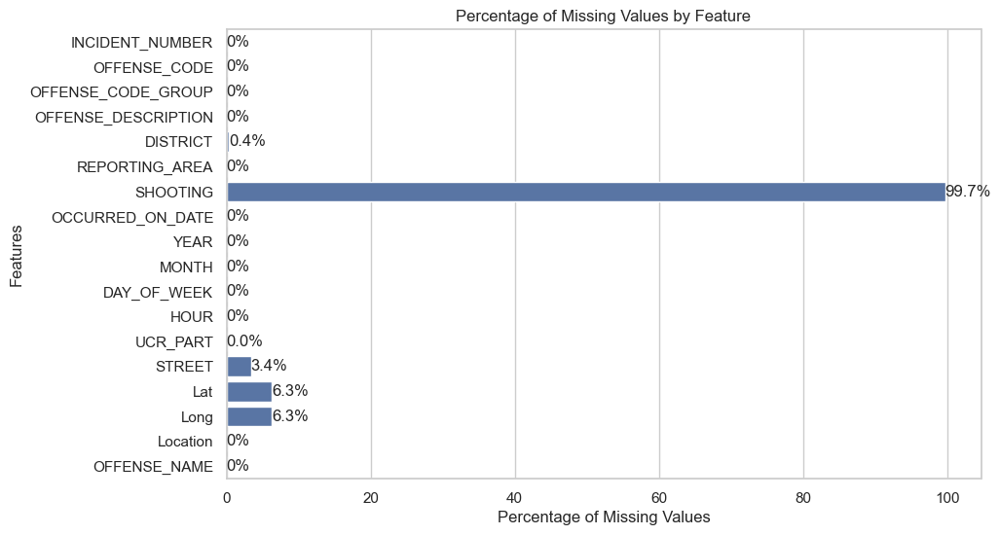

In [38]:
missing_values_count = crimes.isna().sum()
missing_values_percentage = (missing_values_count / len(crimes)) * 100

plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=missing_values_percentage.values, y=missing_values_percentage.index)
plt.title('Percentage of Missing Values by Feature')
plt.xlabel('Percentage of Missing Values')
plt.ylabel('Features')

# Add count annotations to each bar
for bar, count in zip(barplot.patches, missing_values_count):
    percent = bar.get_width()
    if percent == 0:
        text = '0%'
    else:
        text = f'{percent:.1f}%'
    barplot.text(percent, bar.get_y() + bar.get_height() / 2, text, va='center')

plt.show()

The previous visualizations show that most features have a complete or near-complete set of values, except for the SHOOTING variable.   
It is notable that the SHOOTING variable exhibits a significant number of missing values, accounting for 99.7% of its entries. The substantial amount of missing data implies that the field might be designed to document an incident exclusively when a shooting takes place, leaving other entries empty. 

To address this and improve data integrity, we have substituted the missing values with 'N' to indicate instances where a shooting did not occur.

In [57]:
crimes['SHOOTING'].fillna('N', inplace=True)

In [39]:
# Drop useless columns
crimes = crimes.drop(['Location', 'OFFENSE_CODE'], axis=1)

Let's analyze which column is better to our analysis:

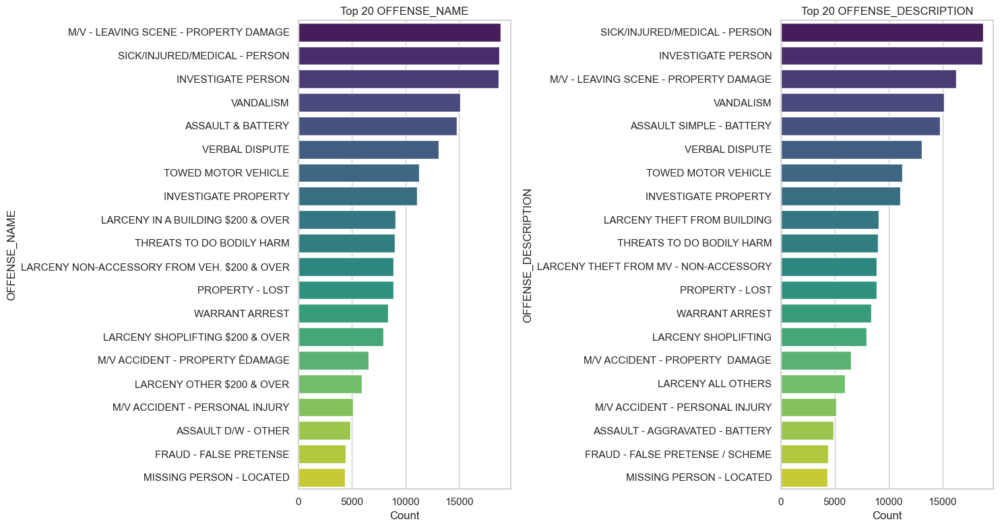

In [40]:
top_20_offense_name = crimes['OFFENSE_NAME'].value_counts().head(20)
top_20_offense_description = crimes['OFFENSE_DESCRIPTION'].value_counts().head(20)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

# Plot top 20 OFFENSE_NAME
sns.barplot(x=top_20_offense_name.values, y=top_20_offense_name.index, ax=axes[0], palette="viridis")
axes[0].set_title('Top 20 OFFENSE_NAME')
axes[0].set_xlabel('Count')
axes[0].set_ylabel('OFFENSE_NAME')

# Plot top 20 OFFENSE_DESCRIPTION
sns.barplot(x=top_20_offense_description.values, y=top_20_offense_description.index, ax=axes[1], palette="viridis")
axes[1].set_title('Top 20 OFFENSE_DESCRIPTION')
axes[1].set_xlabel('Count')
axes[1].set_ylabel('OFFENSE_DESCRIPTION')

plt.tight_layout()
plt.show()

We can see that the 2 features give the same information with a slight difference in the count, however offense description has more easy understandable labels. Thus, we will focus the analysis on it.

# *Explorative Data Analysis*

Now that we have a clean dataset with only the values of interest to us, we can proceed with the exploratory analysis.

Let's analyze the data for the year and the month to highlight any patter:

The distribution of crimes is shown below.

In [41]:
Number_crimes = crimes['OFFENSE_CODE_GROUP'].value_counts()
categories = pd.DataFrame(data=Number_crimes.index, columns=["OFFENSE_CODE_GROUP"])
categories['values'] = Number_crimes.values
categories['category_count'] = categories['OFFENSE_CODE_GROUP'] + " (" + categories['values'].astype(str) + ")"

import plotly.graph_objects as go

# Function to split text at the first space after the 13th character
def custom_split(text, split_length=13):
    if len(text) <= split_length:
        return text
    break_point = text.find(' ', split_length)
    if break_point == -1:
        return text  # No space found, return original text
    return text[:break_point] + '<br>' + custom_split(text[break_point + 1:], split_length)

categories['formatted_label'] = categories['OFFENSE_CODE_GROUP'] + " " + categories['values'].astype(str)
categories['formatted_label'] = categories['formatted_label'].apply(custom_split)

# Create the treemap using Graph Objects
fig = go.Figure(go.Treemap(
    labels=categories['formatted_label'],
    parents=[""] * len(categories),  
    values=categories['values']
))

fig.update_layout(title='Major Crimes in Boston from mid 2015 until 2018')
fig.show()

The visualization reveals a wide range of crime types and frequencies. We observe a spectrum from common incidents like "Motor Vehicle Accidents," which occurred 37,070 times over the four years, to rare occurrences like "Human Trafficking" with only 7 incidents reported.

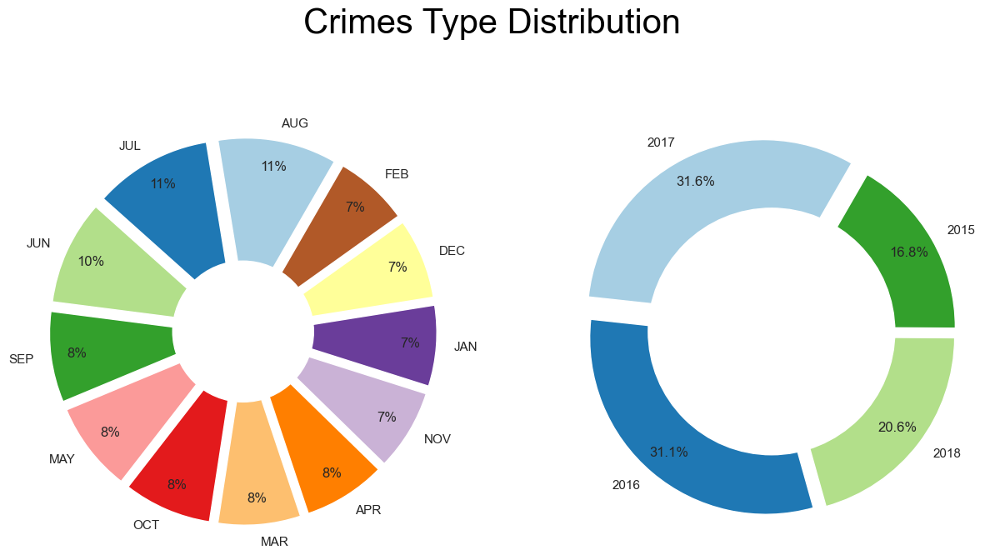

In [42]:
# Data preparation for piecharts
month_counts = crimes['MONTH'].value_counts()
year_counts = crimes['YEAR'].value_counts()

month_names = {
    1: 'JAN', 2: 'FEB', 3: 'MAR', 4: 'APR', 5: 'MAY', 6: 'JUN', 
    7: 'JUL', 8: 'AUG', 9: 'SEP', 10: 'OCT', 11: 'NOV', 12: 'DEC'
}
month_counts.index = month_counts.index.map(month_names)
colors = plt.cm.Paired(range(len(month_counts)))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
fig.suptitle('Crimes Type Distribution', fontsize=30, color='black')

# Month distribution plot
ax1.pie(month_counts, explode=[0.1]*12, startangle=60, labels=month_counts.index, autopct='%1.0f%%', pctdistance=0.85, colors=colors)
ax1.add_artist(plt.Circle((0, 0), 0.4, fc='white'))

# Year distribution plot
explode_year = [0.1 if year == year_counts.idxmax() else 0.05 for year in year_counts.index]
ax2.pie(year_counts, explode=explode_year, startangle=60, labels=year_counts.index, autopct='%1.1f%%', pctdistance=0.85, colors=colors)
ax2.add_artist(plt.Circle((0, 0), 0.7, fc='white'))

plt.show()


 There seems to be an increase in cases from 2015 to 2016. This is normal considering the missing values in 2015. The year 2017 was the year with the highest crime rate and the crime rate is decreasing in 2018. we should also consider the missing data for the last three months in 2018. Although the months with the highest crime rates vary according to years, an increase was observed in the summer months with a general rate.

The frequency of crimes is shown below.

OFFENSE_CODE_GROUP
Motor Vehicle Accident Response              37070
Larceny                                      25882
Medical Assistance                           23504
Investigate Person                           18704
Other                                        18029
                                             ...  
HUMAN TRAFFICKING                                7
INVESTIGATE PERSON                               4
Biological Threat                                2
HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE        2
Burglary - No Property Taken                     2
Name: count, Length: 67, dtype: int64


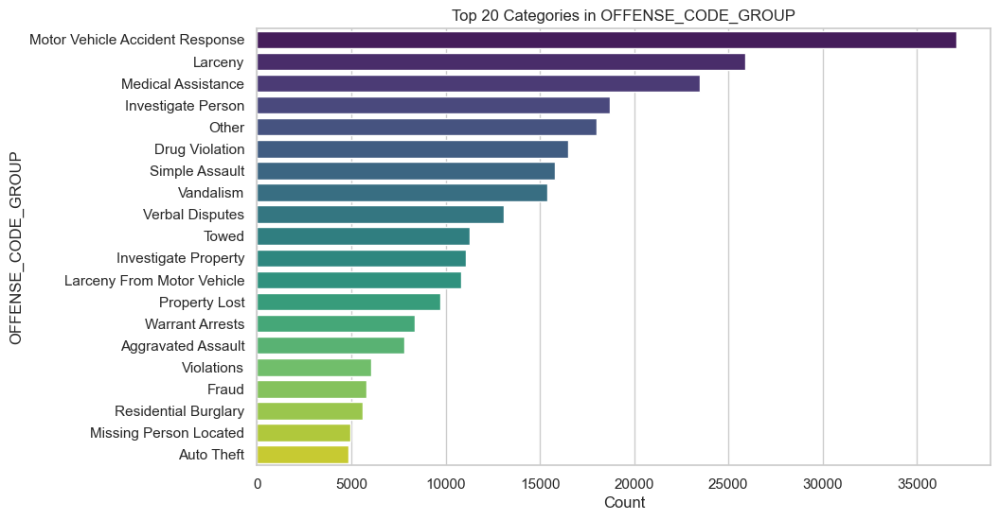

In [43]:
sns.set(style="whitegrid")

offense_code_group_counts = crimes['OFFENSE_CODE_GROUP'].value_counts()
print(offense_code_group_counts)
top_20_offense_code_groups = offense_code_group_counts.head(20)
plt.figure(figsize=(10, 6))
sns.barplot(x=top_20_offense_code_groups.values, y=top_20_offense_code_groups.index, palette="viridis")
plt.title('Top 20 Categories in OFFENSE_CODE_GROUP')
plt.xlabel('Count')
plt.ylabel('OFFENSE_CODE_GROUP')
plt.show()

As can be seen, the five offences with the most records in that year range are:


1. Mothor vehicle accidents
2. Medical Assistance
3. Larceny
4. Investigate Person
5. Assault



*Let's Analyze Temporal Variables*

A representation of the distribution of crimes by year is showed below:

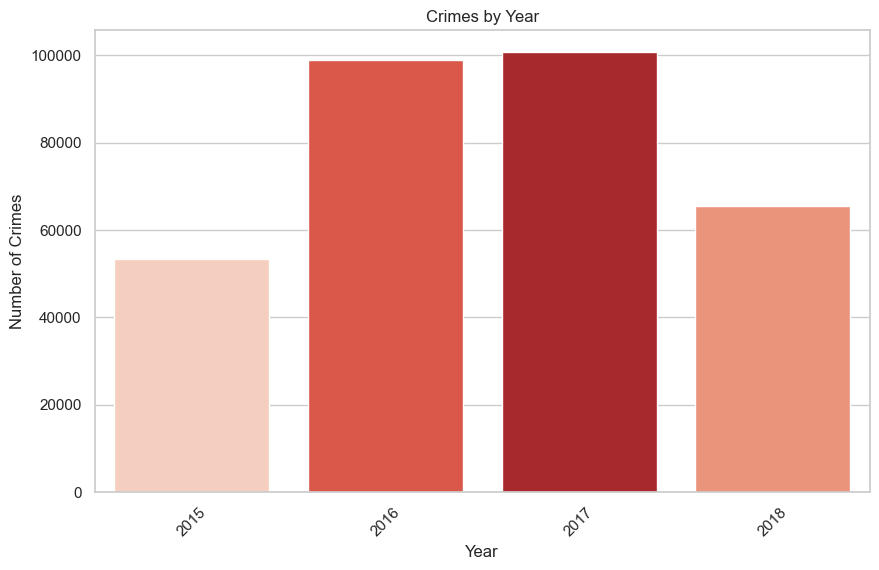

In [44]:
crimes_by_year = crimes['YEAR'].value_counts()
crimes_by_year.index = pd.to_numeric(crimes_by_year.index)

# Sort the Series
crimes_by_year.sort_index(inplace=True)

grading_colors = sns.color_palette("Reds", len(crimes_by_year))

# Sorting the color palette by number of crimes
rank = crimes_by_year.argsort().argsort()   # This provides a ranking of the years
grading_colors = [grading_colors[idx] for idx in rank]

plt.figure(figsize=(10, 6))
sns.barplot(x=crimes_by_year.index, y=crimes_by_year.values, palette=grading_colors)
plt.title('Crimes by Year')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.show()

The years 2017 and 2018 have almost double the number of crimes compared to 2015 and 2016. This can be related to the timeframe of the dataset.

Let's then visualize the crimes by month:

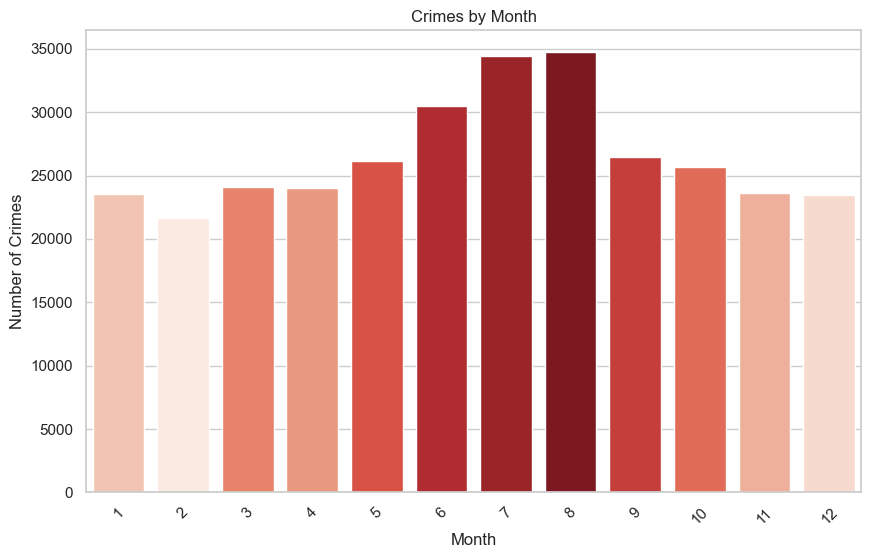

In [45]:
crimes_by_month = crimes['MONTH'].value_counts()
crimes_by_month.index = pd.to_numeric(crimes_by_month.index)

# Sort the Series
crimes_by_month.sort_index(inplace=True)

# Creating a color palette ranging from darkest (most crimes) to lightest (least crimes)
grading_colors = sns.color_palette("Reds", len(crimes_by_month))

# Sorting the color palette by number of crimes
rank = crimes_by_month.argsort().argsort() 
grading_colors = [grading_colors[idx] for idx in rank]

plt.figure(figsize=(10, 6))
sns.barplot(x=crimes_by_month.index, y=crimes_by_month.values, palette=grading_colors)
plt.title('Crimes by Month')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.show()

there is a noticeable peak in the summer months of June, July, and August, with counts exceeding 30,000. This goes in agreement with the pattern highlighted above for the distribution, but again, as this is a partial dataset starting in summer 2015 and ending in late summer 2018, the results could be affected by the effetive presence of more data in those seasons.

Let's plot then the distrution by day:

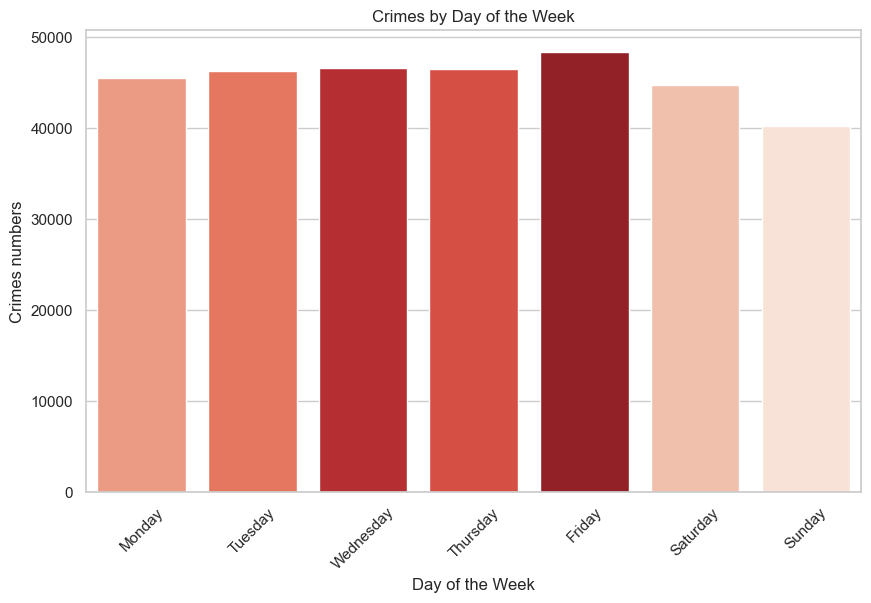

In [46]:
crimes_by_day = crimes['DAY_OF_WEEK'].value_counts()

# Instering the days of the week in an ordered way
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
crimes_by_day = crimes_by_day.reindex(ordered_days)
grading_colors = sns.color_palette("Reds", len(crimes_by_day))
rank = crimes_by_day.argsort().argsort()   
grading_colors = [grading_colors[idx] for idx in rank]


plt.figure(figsize=(10, 6))
sns.barplot(x=crimes_by_day.index, y=crimes_by_day.values, palette= grading_colors)
plt.title('Crimes by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Crimes numbers')
plt.xticks(rotation=45)
plt.show()

It appears that Friday is the most crime-prone day, while Sunday has the least criminal activity, according to the dataset in question.  
Let's then visualize the distribution of crimes by hour of the day:

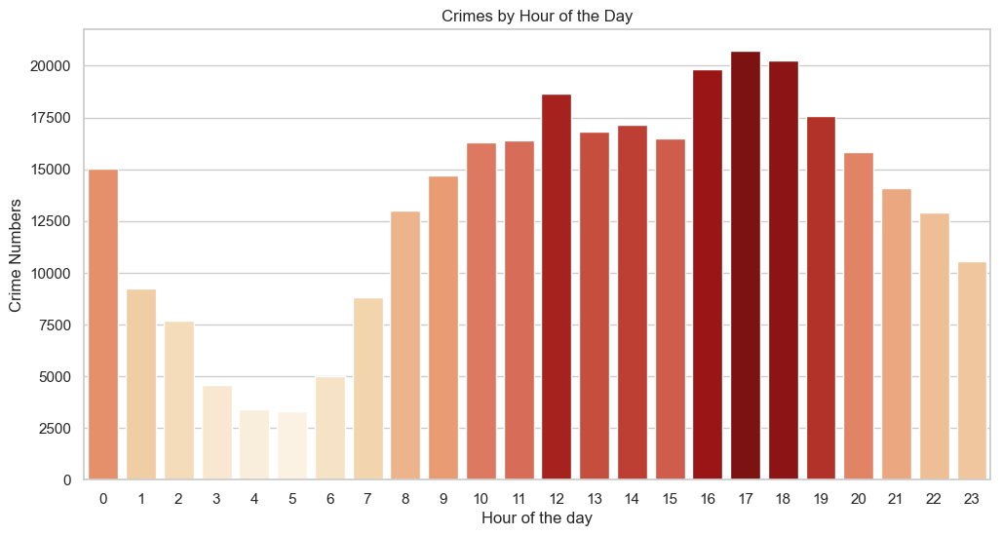

In [47]:
crimes_by_hour = crimes['HOUR'].value_counts().sort_index()
color_scale = sns.color_palette("OrRd", len(crimes_by_hour))

rank = crimes_by_hour.argsort().argsort()  
color_scale = [color_scale[idx] for idx in rank]

plt.figure(figsize=(12, 6))
sns.barplot(x=crimes_by_hour.index, y=crimes_by_hour.values, palette=color_scale)
plt.title('Crimes by Hour of the Day')
plt.xlabel('Hour of the day')
plt.ylabel('Crime Numbers')
plt.xticks(range(0, 24))
plt.show()

From the graph we can see that the time when the most crimes are recorded is 5 p.m. While the time with the least number of recorded crimes turns out to be 5 a.m.

To provide a more detailed and accurate interpretation of the graph, we proceed by examining the exact numerical values. This will allow us to identify the hours with the highest and lowest frequency of crimes.

In [48]:
crimes_by_hour_sorted = crimes_by_hour.sort_values(ascending=False)

#Highest number of crimes and the hour
most_crime_hour = crimes_by_hour_sorted.index[0]
most_crime_hour_number = crimes_by_hour_sorted.iloc[0]

#Lowest number of crimes and the hour
least_crime_hour = crimes_by_hour_sorted.index[-1]
least_crime_hour_number = crimes_by_hour_sorted.iloc[-1]

most_crime_hour, most_crime_hour_number, least_crime_hour, least_crime_hour_number


(17, 20719, 5, 3301)


From the analysis of the numerical values, we can confirm the graph visualization, saying that:



*   The hour with the highest number of crimes is 5 p.m. (5 PM), with 20,763 crimes recorded.
*   The hour with the lowest number of crimes is 5:00 AM (5 AM), with 3,311 crimes recorded.

These numbers indicate that most crimes occur in the late afternoon, while the early morning is the period with the least criminal activity.

c:\Users\andre\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\polynomial.py:667: RuntimeWarning:

overflow encountered in multiply

c:\Users\andre\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning:

overflow encountered in reduce

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\2167347822.py:16: RankWarning:

Polyfit may be poorly conditioned



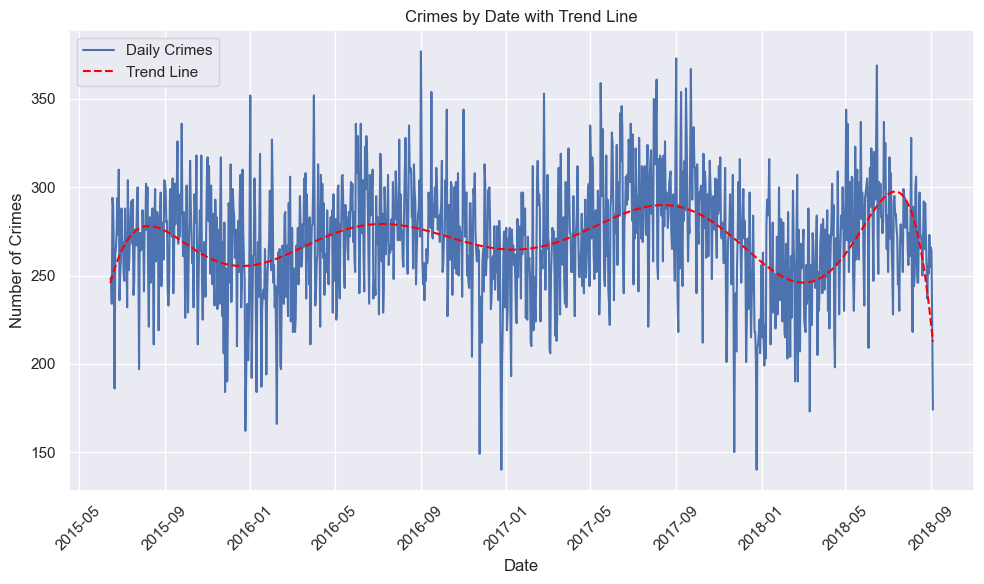

In [49]:
sns.set(style="darkgrid")
crimes['OCCURRED_ON_DATE'] = pd.to_datetime(crimes['OCCURRED_ON_DATE'])
crimes['DATE'] = crimes['OCCURRED_ON_DATE'].dt.date

# Aggregating data by Day
daily_crime_counts = crimes['DATE'].value_counts().sort_index()

# Convert dates to matplotlib format
mpl_dates = mdates.date2num(daily_crime_counts.index)

# Plotting crimes by date with a trend line
plt.figure(figsize=(10, 6))
plt.plot(daily_crime_counts.index, daily_crime_counts.values, label='Daily Crimes')

# Calculating and plotting a trend line
z = np.polyfit(mpl_dates, daily_crime_counts.values, 50)
p = np.poly1d(z)
plt.plot(daily_crime_counts.index, p(mpl_dates), color='red', linestyle='--', label='Trend Line')

plt.title('Crimes by Date with Trend Line')
plt.xlabel('Date')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

The plot highlights notable fluctuations in crime rates. Again, a seasonal trend is apparent: crime rates decrease towards January, rise to a peak around July, and then diminish again.



These observations provide an initial understanding of the crime landscape in Boston, highlighting the importance of temporal and spatial factors in crime analysis.

Let's analyze where these crimes happens. Which district has the most/least number of reported crimes?

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\130885818.py:5: UserWarning:

The palette list has more values (13) than needed (12), which may not be intended.



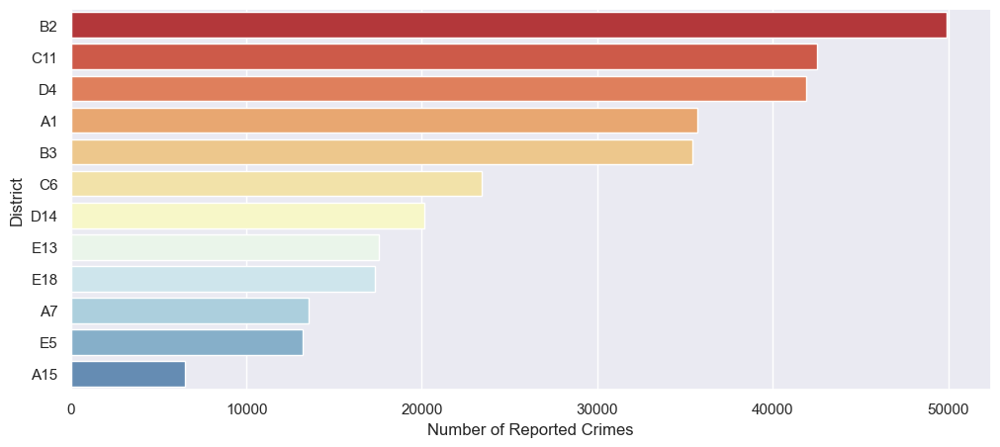

In [51]:
custom_palette = sns.color_palette("RdYlBu", n_colors=len(crimes['DISTRICT'].unique()))
district_crime_counts = crimes['DISTRICT'].value_counts().reset_index()
district_crime_counts.columns = ['DISTRICT', 'Number_of_Crimes']  # Renaming the columns

sns.barplot(data=district_crime_counts, 
            x='Number_of_Crimes', y='DISTRICT', 
            order=district_crime_counts.sort_values('Number_of_Crimes', ascending=False)['DISTRICT'],
            palette=custom_palette)

plt.xlabel('Number of Reported Crimes')
plt.ylabel('District')
plt.gcf().set_size_inches(12, 5)
plt.show()

District B2 has the most number of reported crimes while district A15 has the least number of reported crimes, but is the severity of the crimes different between district B2 and A15? (Please refer to the previous graph)

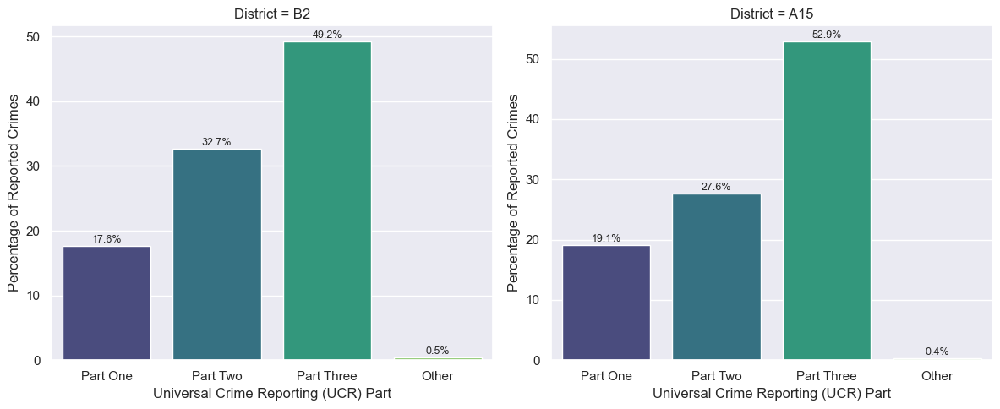

In [52]:
#percentages
crimes['count'] = 1
b2_counts = crimes[crimes['DISTRICT'] == 'B2'].groupby('UCR_PART').count()['count']
b2_percent = (b2_counts / b2_counts.sum() * 100).reset_index(name='percentage')

a15_counts = crimes[crimes['DISTRICT'] == 'A15'].groupby('UCR_PART').count()['count']
a15_percent = (a15_counts / a15_counts.sum() * 100).reset_index(name='percentage')

custom_palette = sns.color_palette("viridis", 4)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# District B2
sns.barplot(ax=axes[0], data=b2_percent,
            x='UCR_PART', y='percentage', order=['Part One', 'Part Two', 'Part Three', 'Other'],
            palette=custom_palette)
axes[0].set(xlabel='Universal Crime Reporting (UCR) Part',
            ylabel='Percentage of Reported Crimes', title='District = B2')

# District A15
sns.barplot(ax=axes[1], data=a15_percent,
            x='UCR_PART', y='percentage', order=['Part One', 'Part Two', 'Part Three', 'Other'],
            palette=custom_palette)
axes[1].set(xlabel='Universal Crime Reporting (UCR) Part',
            ylabel='Percentage of Reported Crimes', title='District = A15')

# Annotate the percentages on the bars
for ax in axes:
    for p in ax.patches:
        ax.annotate(f"{p.get_height():.1f}%", (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='center', fontsize=9, xytext=(0, 5),
                    textcoords='offset points')

plt.tight_layout()
plt.show()

District A15 appears to have less 'Part Two' UCR reported crimes than district B2. Let's use the Chi-Square test to confirm/disprove this.

In [54]:
filtered_dist = crimes[crimes['DISTRICT'].isin(['B2', 'A15'])]

# Create a contingency table for the chi-square test
contingency_table = pd.crosstab(filtered_dist['DISTRICT'], filtered_dist['UCR_PART'])

# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

chi2, p, contingency_table, expected

(69.3668720287279,
 5.832060094035585e-15,
 UCR_PART  Other  Part One  Part Three  Part Two
 DISTRICT                                       
 A15          24      1240        3424      1789
 B2          236      8800       24580     16307,
 array([[   29.85851064,  1152.99787234,  3215.9912766 ,  2078.15234043],
        [  230.14148936,  8887.00212766, 24788.0087234 , 16017.84765957]]))

In [55]:
contingency_table_head = contingency_table.head()
nan_check = contingency_table.isna().sum()
contingency_table_head, nan_check

(UCR_PART  Other  Part One  Part Three  Part Two
 DISTRICT                                       
 A15          24      1240        3424      1789
 B2          236      8800       24580     16307,
 UCR_PART
 Other         0
 Part One      0
 Part Three    0
 Part Two      0
 dtype: int64)

In [56]:
# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

chi2, p, dof, expected

(69.3668720287279,
 5.832060094035585e-15,
 3,
 array([[   29.85851064,  1152.99787234,  3215.9912766 ,  2078.15234043],
        [  230.14148936,  8887.00212766, 24788.0087234 , 16017.84765957]]))

The very low p-value (much less than 0.05) suggests that there is a statistically significant difference in the distribution of crime severity (as categorized by 'UCR_PART') between districts B2 and A15. This means that the severity of crimes reported in these districts is not the same and varies significantly.

In [ ]:
# relative frequencies for each category of 'UCR_PART' for districts B2 and A15
freq_B2 = contingency_table.loc['B2'] / contingency_table.loc['B2'].sum()
freq_A15 = contingency_table.loc['A15'] / contingency_table.loc['A15'].sum()
diff_freq = (freq_B2 - freq_A15) * 100  


freq_comparison_df = pd.DataFrame({
    'UCR_PART': contingency_table.columns,
    'Freq_B2 (%)': freq_B2.values * 100,
    'Freq_A15 (%)': freq_A15.values * 100,
    'Diff_B2_A15 (%)': diff_freq.values
})

freq_comparison_df.sort_values('Diff_B2_A15 (%)', ascending=False)

,UCR_PART,Freq_B2 (%),Freq_A15 (%),Diff_B2_A15 (%)
3,Part Two,32.664303,27.620812,5.043491
0,Other,0.472728,0.370542,0.102186
1,Part One,17.627146,19.144666,-1.517520
2,Part Three,49.235823,52.863980,-3.628157


Based on the Chi-Square test, the severity of crimes do differ between district B2 and A15; based on the frequency distribution table, district B2 has about 5% more UCR 'Part Two' reported crimes and about 3.6% less UCR 'Part Three' reported crimes than district A15.

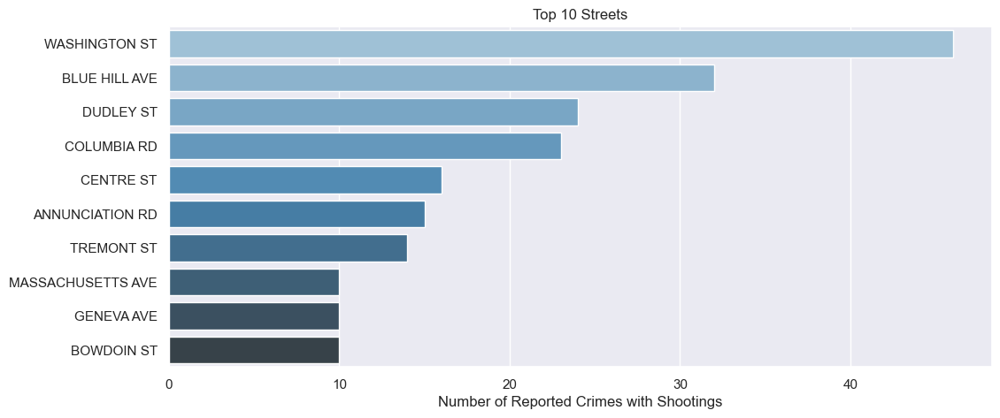

In [59]:
temp_df = crimes.loc[crimes['SHOOTING']=='Y', 'STREET'] \
                 .value_counts().reset_index()

custom_palette = sns.color_palette("Blues_d", n_colors=10)

sns.barplot(data=temp_df.nlargest(10, 'count'), 
            x='count', y='STREET', 
            order=temp_df.nlargest(10, 'count')['STREET'],
            palette=custom_palette)

plt.xlabel('Number of Reported Crimes with Shootings')
plt.ylabel('')
plt.title('Top 10 Streets')
plt.gcf().set_size_inches(12, 5)
plt.show()

Washington St' street has the most reported crimes with shootings.

# *Focus on Specific Crimes*

Let's analyze specific crimes to see where they are located and which are their specificities.

- Where there are more **mothor vehicle accidents**? How are they distributed? 

In [60]:
accidents = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Motor Vehicle Accident Response']

# Drop any rows without latitude or longitude
accidents = accidents.dropna(subset=['Lat', 'Long'])

# Create a map centered at Boston (coordinates found online)
map_center = [42.356145,-71.064083]
crime_map = folium.Map(location=map_center, zoom_start = 12, min_zoom=12, max_zoom=12)  # You can adjust zoom level

# Create a Heatmap layer with adjusted parameters for transparency and detail
heat_data = [[row['Lat'], row['Long']] for index, row in accidents.iterrows()]
HeatMap(heat_data, radius=11).add_to(crime_map)  # Adjust radius, blur, opacity

# Create a custom legend as HTML
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            top: 50px; left: 50px; width: 120px; height: 100px; 
            border:2px solid grey; z-index:9999; font-size:14px; background:white;
            padding: 5px; border-radius: 3px; display: flex; align-items: center;">
    <div style="background: linear-gradient(to top, red, yellow, green, lightblue); 
                width: 20px; height: 50px; margin-right: 5px;"></div>
    <div>
        <div style="color: #333; font-size: 12px; text-align: left; margin-bottom: 30px; font-weight: bold;">
            Low Density
        </div>
        <div style="color: #333; font-size: 12px; text-align: left; font-weight: bold;">
            High Density
        </div>
    </div>
</div>
{% endmacro %}
"""

# Add the legend to the map
macro = MacroElement()
macro._template = Template(template)
crime_map.get_root().add_child(macro)

As we saw from the analysis, the number of crimes recorded varies greatly between years, peaking in 2017. This suggests that the increase observed in some types of crimes through 2017 may be due, at least in part, to the higher number of crimes recorded overall that year, rather than a true increase in the frequency of those types of crimes.

When analyzing this data, it is therefore important to look at the total number of crimes recorded each year to get a more accurate picture of trends. One way to do this might be to normalize the data by the total number of crimes per year to get a more accurate measure of the relative frequency of each type of crime.

In [61]:
crimes['Year'] = crimes['OCCURRED_ON_DATE'].dt.year
crimes['Month'] = crimes['OCCURRED_ON_DATE'].dt.month_name()
crimes_by_year_month_group = crimes.groupby(['Year', 'Month', 'OFFENSE_CODE_GROUP']).size().unstack(fill_value=0)
crimes_by_year_month= crimes.groupby(['Year', 'Month']).size().unstack(fill_value=0)

record_count_by_year = crimes_by_year_month.sum(axis=1)

# Normalizing data
normalized_crimes_by_year_month = crimes_by_year_month_group.divide(record_count_by_year, axis=0)
normalized_crimes_by_year_month.head()  

OFFENSE_CODE_GROUP  Aggravated Assault  Aircraft     Arson  \
Year Month                                                   
2015 August                   0.004124  0.000019  0.000019   
     December                 0.003468  0.000056  0.000000   
     July                     0.004593  0.000000  0.000000   
     June                     0.002325  0.000000  0.000019   
     November                 0.003787  0.000000  0.000037   

OFFENSE_CODE_GROUP  Assembly or Gathering Violations  Auto Theft  \
Year Month                                                         
2015 August                                 0.000412    0.003112   
     December                               0.000431    0.002250   
     July                                   0.000394    0.003337   
     June                                   0.000281    0.001237   
     November                               0.000750    0.002081   

OFFENSE_CODE_GROUP  Auto Theft Recovery  Ballistics  Biological Threat  \
Year Month                                                               
2015 August                    0.000412    0.000544                0.0   
     December                  0.000394    0.000469                0.0   
     July                      0.000450    0.000562                0.0   
     June                      0.000150    0.000225                0.0   
     November                  0.000337    0.000375                0.0   

OFFENSE_CODE_GROUP  Bomb Hoax  Burglary - No Property Taken  ...  \
Year Month                                                   ...   
2015 August          0.000056                      0.000000  ...   
     December        0.000075                      0.000019  ...   
     July            0.000037                      0.000000  ...   
     June            0.000037                      0.000000  ...   
     November        0.000056                      0.000000  ...   

OFFENSE_CODE_GROUP  Restraining Order Violations   Robbery  Search Warrants  \
Year Month                                                                    
2015 August                             0.000825  0.002587         0.000450   
     December                           0.000619  0.002662         0.000394   
     July                               0.000712  0.002718         0.000450   
     June                               0.000244  0.000975         0.000281   
     November                           0.000769  0.002831         0.000544   

OFFENSE_CODE_GROUP   Service  Simple Assault     Towed  Vandalism  \
Year Month                                                          
2015 August         0.000281        0.007667  0.004574   0.008173   
     December       0.000112        0.007405  0.004499   0.007817   
     July           0.000225        0.008436  0.003637   0.007592   
     June           0.000037        0.003768  0.002062   0.003937   
     November       0.000056        0.007105  0.004424   0.007161   

OFFENSE_CODE_GROUP  Verbal Disputes  Violations  Warrant Arrests  
Year Month                                                        
2015 August                0.004162    0.003824         0.003862  
     December              0.004818    0.003262         0.003637  
     July                  0.004743    0.004349         0.003918  
     June                  0.002100    0.001856         0.001893  
     November              0.004537    0.003581         0.003449  

[5 rows x 67 columns]

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\1717964401.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\1717964401.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



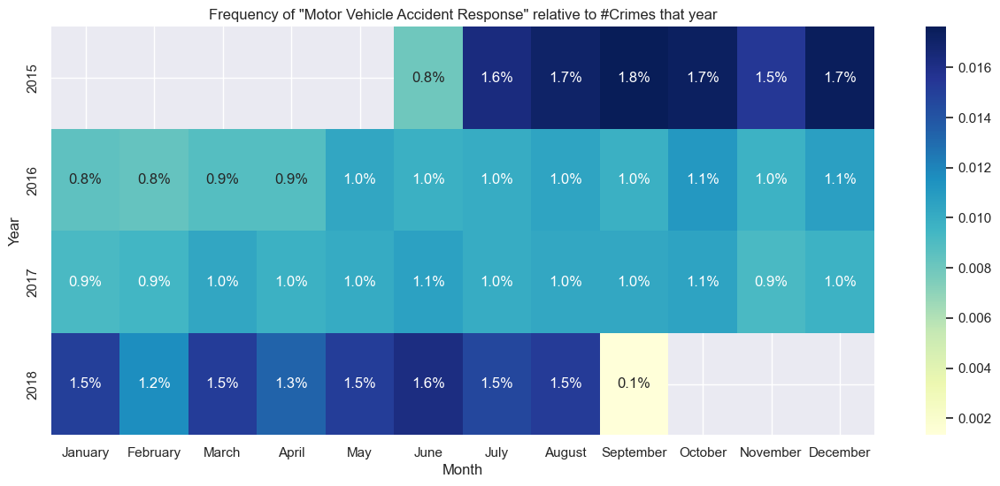

In [122]:
mv_accidents = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Motor Vehicle Accident Response']

mv_accidents['Year'] = mv_accidents['OCCURRED_ON_DATE'].dt.year
mv_accidents['Month'] = mv_accidents['OCCURRED_ON_DATE'].dt.month_name()


mv_accidents_year_month = mv_accidents.groupby(['Year', 'Month']).size()


total_crimes_per_year = crimes.groupby(crimes['OCCURRED_ON_DATE'].dt.year).size()


relative_frequency = mv_accidents_year_month.div(total_crimes_per_year, level='Year')
relative_frequency_unstacked = relative_frequency.unstack()

months_ordered = ['January', 'February', 'March', 'April', 'May', 'June',
                  'July', 'August', 'September', 'October', 'November', 'December']
relative_frequency_unstacked = relative_frequency_unstacked.reindex(columns=months_ordered)

plt.figure(figsize=(15, 6))
sns.heatmap(relative_frequency_unstacked, cmap="YlGnBu", annot=True, fmt=".3f")
plt.title('Frequency of "Motor Vehicle Accident Response" relative to #Crimes that year')
plt.xlabel('Month')
plt.ylabel('Year')


for t in plt.gca().texts:
    current_text = float(t.get_text()) * 100  # Convert to percentage
    t.set_text(f"{current_text:.1f}%")

plt.show()

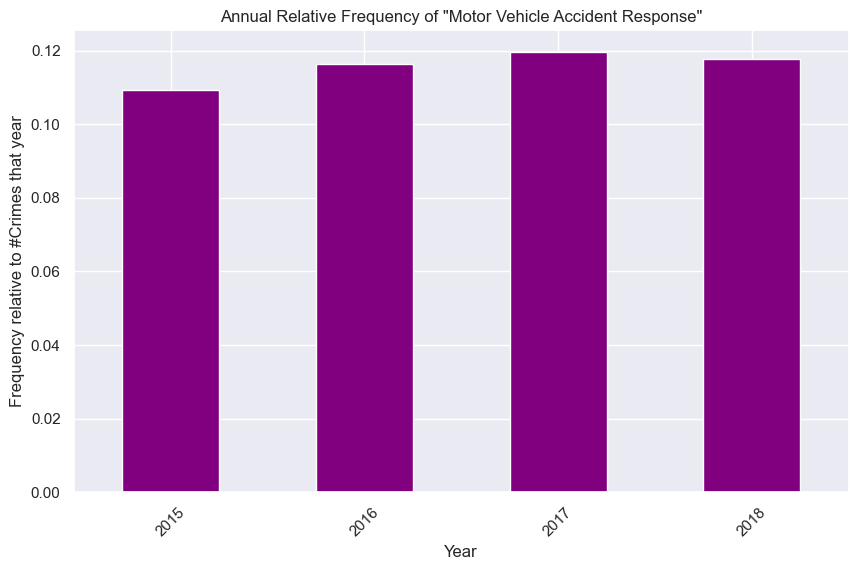

In [123]:
mv_accidents_annual = mv_accidents.groupby('Year').size()

# Calculating the total count of crimes per year
total_crimes_annual = crimes.groupby(crimes['OCCURRED_ON_DATE'].dt.year).size()

# Calculating the relative frequency of 'Motor Vehicle Accident Response' incidents for each year
relative_frequency_annual = mv_accidents_annual.div(total_crimes_annual, level='Year')

# Creating a barplot for the relative frequency
plt.figure(figsize=(10, 6))
(relative_frequency_annual).plot(kind='bar',  color='purple') 
plt.title('Annual Relative Frequency of "Motor Vehicle Accident Response"')
plt.xlabel('Year')
plt.ylabel('Frequency relative to #Crimes that year')
plt.xticks(rotation=45)
plt.show()

Let's see now how accidents are distributed during the week

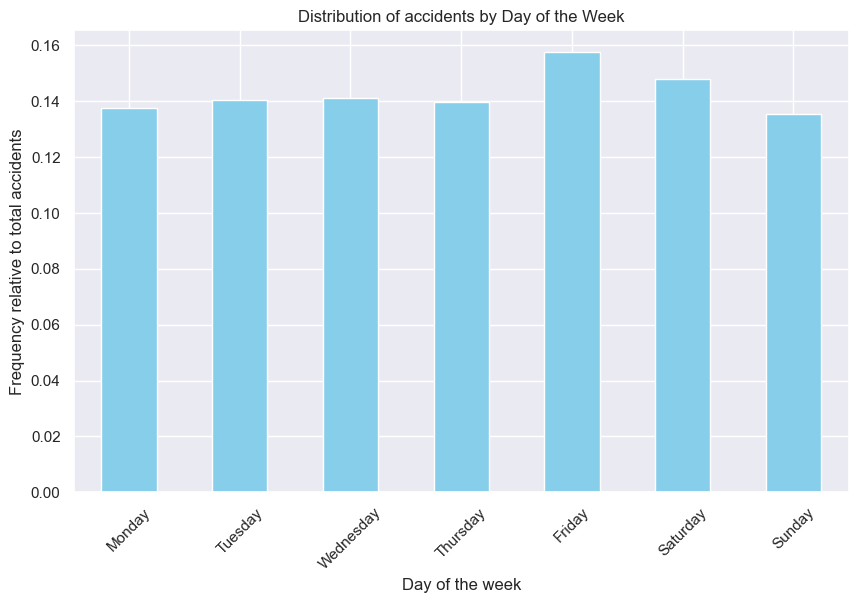

In [124]:
crimes_by_day = crimes['DAY_OF_WEEK'].value_counts()

mv_accidents_dayofweek = mv_accidents.groupby('DAY_OF_WEEK').size() / mv_accidents.groupby('DAY_OF_WEEK').size().sum()

days_ordered = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
mv_accidents_dayofweek = mv_accidents_dayofweek.reindex(days_ordered)

plt.figure(figsize=(10, 6))
mv_accidents_dayofweek.plot(kind='bar', color='skyblue')
plt.title('Distribution of accidents by Day of the Week')
plt.xlabel('Day of the week')
plt.ylabel('Frequency relative to total accidents')
plt.xticks(rotation=45)
plt.show()

In continuity with what was seen for the general analyses, weekends (Saturday and Sunday) also have a higher frequency of accidents than weekdays for this crime.

Let's then analyse the Hourly Frequency:

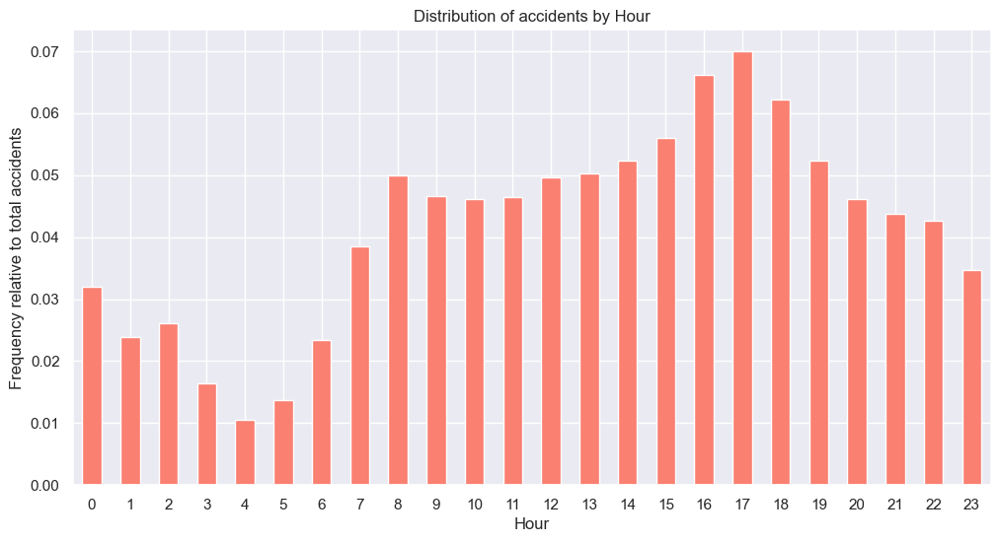

In [69]:
mv_accidents_hour = mv_accidents.groupby('HOUR').size() / mv_accidents.groupby('HOUR').size().sum()

plt.figure(figsize=(12, 6))
mv_accidents_hour.plot(kind='bar', color='salmon')
plt.title('Distribution of accidents by Hour')
plt.xlabel('Hour')
plt.ylabel('Frequency relative to total accidents')
plt.xticks(rotation=0)
plt.show()

We observe peaks during the morning and evening rush hours (e.g., 7:00 am to 9:00 am and 4:00 pm to 6:00 pm), which may indicate high traffic volume and a higher probability of accidents during these periods

Let's switch to the analysis of **Larceny**.   

Where are larcencys more spread out, which is its distribution? We start by seeing where they are located in the city:

In [ ]:
Larceny = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Larceny']

# Drop any rows without latitude or longitude
Larceny = Larceny.dropna(subset=['Lat', 'Long'])

# Create a map centered at Boston (coordinates found online)
map_center = [42.356145,-71.064083]
crime_map = folium.Map(location=map_center, zoom_start = 12, min_zoom=12, max_zoom=12)  # You can adjust zoom level

# Create a Heatmap layer with adjusted parameters for transparency and detail
heat_data = [[row['Lat'], row['Long']] for index, row in Larceny.iterrows()]
HeatMap(heat_data, radius=11).add_to(crime_map)  # Adjust radius, blur, opacity

# Create a custom legend as HTML
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            top: 50px; left: 50px; width: 120px; height: 100px; 
            border:2px solid grey; z-index:9999; font-size:14px; background:white;
            padding: 5px; border-radius: 3px; display: flex; align-items: center;">
    <div style="background: linear-gradient(to top, red, yellow, green, lightblue); 
                width: 20px; height: 50px; margin-right: 5px;"></div>
    <div>
        <div style="color: #333; font-size: 12px; text-align: left; margin-bottom: 30px; font-weight: bold;">
            Low Density
        </div>
        <div style="color: #333; font-size: 12px; text-align: left; font-weight: bold;">
            High Density
        </div>
    </div>
</div>
{% endmacro %}
"""

# Add the legend to the map
macro = MacroElement()
macro._template = Template(template)
crime_map.get_root().add_child(macro)

crime_map

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\731244997.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\731244997.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



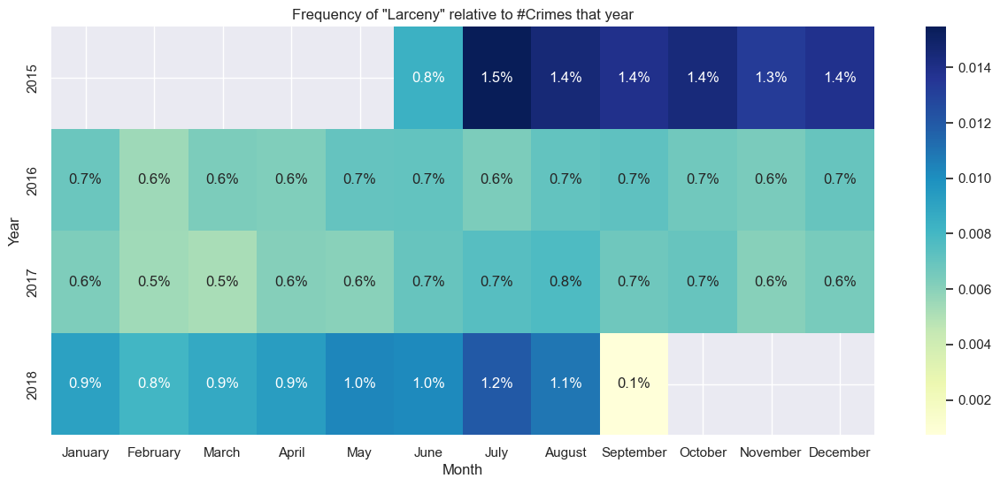

In [79]:
mv_accidents = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Larceny']

mv_accidents['Year'] = mv_accidents['OCCURRED_ON_DATE'].dt.year
mv_accidents['Month'] = mv_accidents['OCCURRED_ON_DATE'].dt.month_name()


mv_accidents_year_month = mv_accidents.groupby(['Year', 'Month']).size()


total_crimes_per_year = crimes.groupby(crimes['OCCURRED_ON_DATE'].dt.year).size()


relative_frequency = mv_accidents_year_month.div(total_crimes_per_year, level='Year')
relative_frequency_unstacked = relative_frequency.unstack()

months_ordered = ['January', 'February', 'March', 'April', 'May', 'June',
                  'July', 'August', 'September', 'October', 'November', 'December']
relative_frequency_unstacked = relative_frequency_unstacked.reindex(columns=months_ordered)

plt.figure(figsize=(15, 6))
sns.heatmap(relative_frequency_unstacked, cmap="YlGnBu", annot=True, fmt=".3f")
plt.title('Frequency of "Larceny" relative to #Crimes that year')
plt.xlabel('Month')
plt.ylabel('Year')


for t in plt.gca().texts:
    current_text = float(t.get_text()) * 100  # Convert to percentage
    t.set_text(f"{current_text:.1f}%")

plt.show()

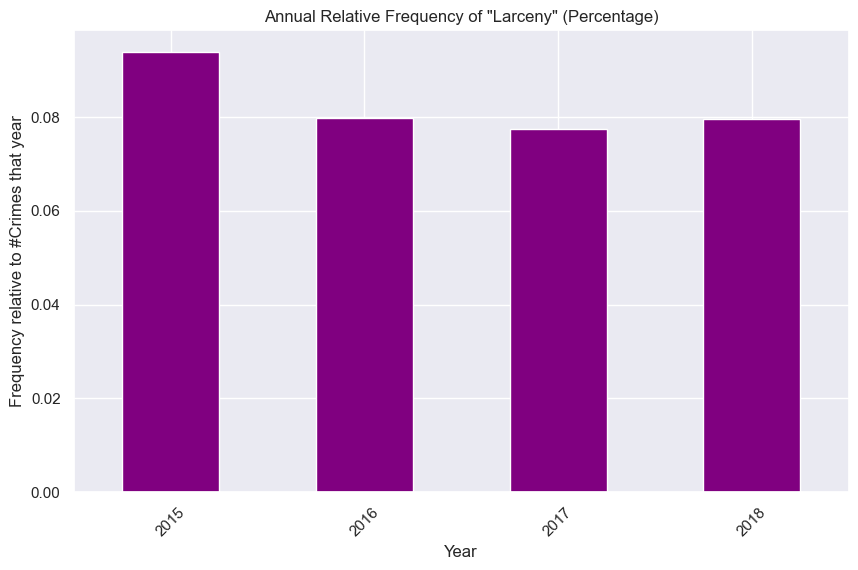

In [80]:
mv_accidents_annual = mv_accidents.groupby('Year').size()

# Calculating the total count of crimes per year
total_crimes_annual = crimes.groupby(crimes['OCCURRED_ON_DATE'].dt.year).size()

# Calculating the relative frequency of incidents for each year
relative_frequency_annual = mv_accidents_annual.div(total_crimes_annual, level='Year')

# Creating a barplot for the relative frequency
plt.figure(figsize=(10, 6))
(relative_frequency_annual).plot(kind='bar',  color='purple') 
plt.title('Annual Relative Frequency of "Larceny"')
plt.xlabel('Year')
plt.ylabel('Frequency relative to #Crimes that year')
plt.xticks(rotation=45)
plt.show()

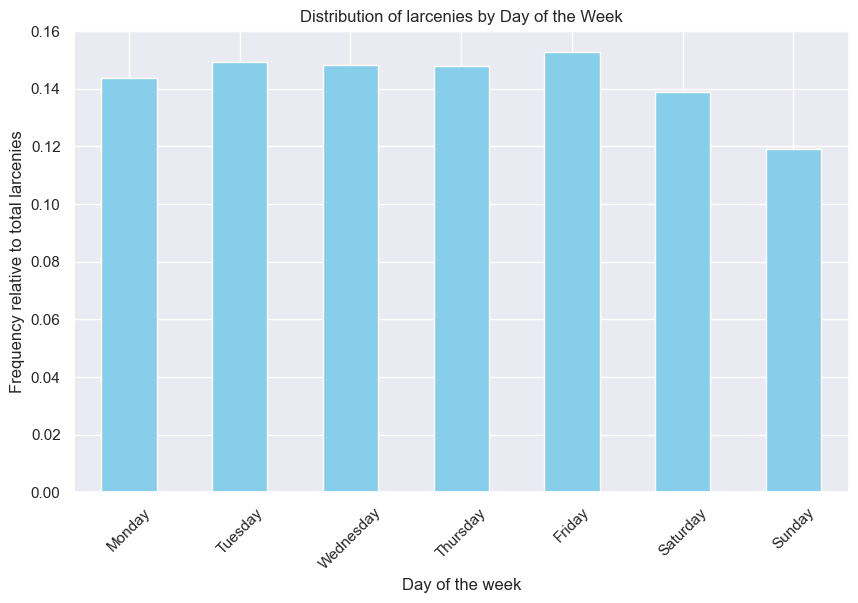

In [81]:
crimes_by_day = crimes['DAY_OF_WEEK'].value_counts()

mv_accidents_dayofweek = mv_accidents.groupby('DAY_OF_WEEK').size() / mv_accidents.groupby('DAY_OF_WEEK').size().sum()

days_ordered = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
mv_accidents_dayofweek = mv_accidents_dayofweek.reindex(days_ordered)

plt.figure(figsize=(10, 6))
mv_accidents_dayofweek.plot(kind='bar', color='skyblue')
plt.title('Distribution of larcenies by Day of the Week')
plt.xlabel('Day of the week')
plt.ylabel('Frequency relative to total larcenies')
plt.xticks(rotation=45)
plt.show()

Let's then analyse the Hourly Frequency:

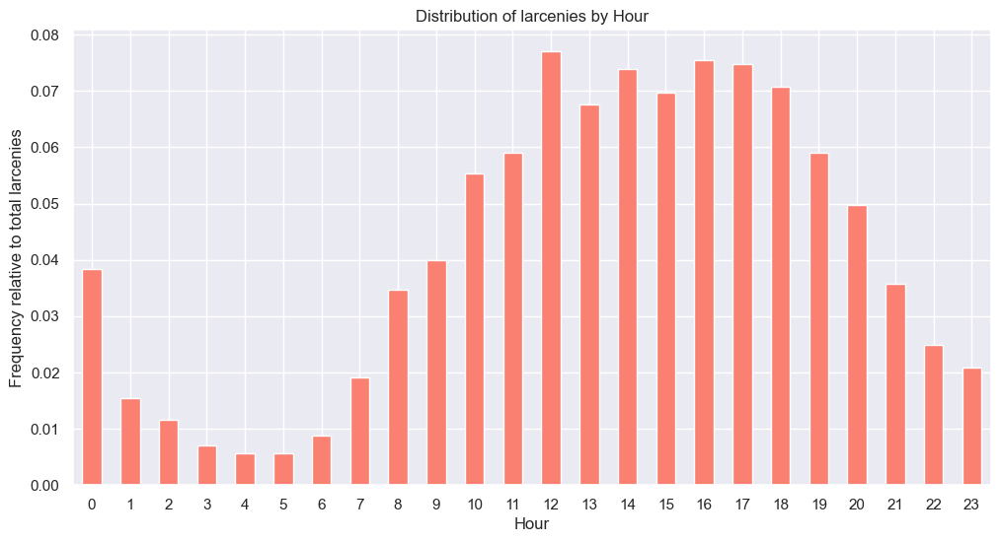

In [82]:
mv_accidents_hour = mv_accidents.groupby('HOUR').size() / mv_accidents.groupby('HOUR').size().sum()

plt.figure(figsize=(12, 6))
mv_accidents_hour.plot(kind='bar', color='salmon')
plt.title('Distribution of larcenies by Hour')
plt.xlabel('Hour')
plt.ylabel('Frequency relative to total larcenies')
plt.xticks(rotation=0)
plt.show()

Let's switch to the analysis of **Vandalism**.   

Where is vandalism more spread out, which is its distribution? We start by seeing where they are located in the city:

In [ ]:
Vandalism = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Vandalism']

Vandalism = Vandalism.dropna(subset=['Lat', 'Long'])

# Create a map centered at Boston (coordinates found online)
map_center = [42.356145,-71.064083]
crime_map = folium.Map(location=map_center, zoom_start = 12, min_zoom=12, max_zoom=12)  # You can adjust zoom level

# Create a Heatmap layer with adjusted parameters for transparency and detail
heat_data = [[row['Lat'], row['Long']] for index, row in Vandalism.iterrows()]
HeatMap(heat_data, radius=11).add_to(crime_map)  # Adjust radius, blur, opacity

# Create a custom legend as HTML
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            top: 50px; left: 50px; width: 120px; height: 100px; 
            border:2px solid grey; z-index:9999; font-size:14px; background:white;
            padding: 5px; border-radius: 3px; display: flex; align-items: center;">
    <div style="background: linear-gradient(to top, red, yellow, green, lightblue); 
                width: 20px; height: 50px; margin-right: 5px;"></div>
    <div>
        <div style="color: #333; font-size: 12px; text-align: left; margin-bottom: 30px; font-weight: bold;">
            Low Density
        </div>
        <div style="color: #333; font-size: 12px; text-align: left; font-weight: bold;">
            High Density
        </div>
    </div>
</div>
{% endmacro %}
"""

# Add the legend to the map
macro = MacroElement()
macro._template = Template(template)
crime_map.get_root().add_child(macro)

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\4077924965.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\4077924965.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



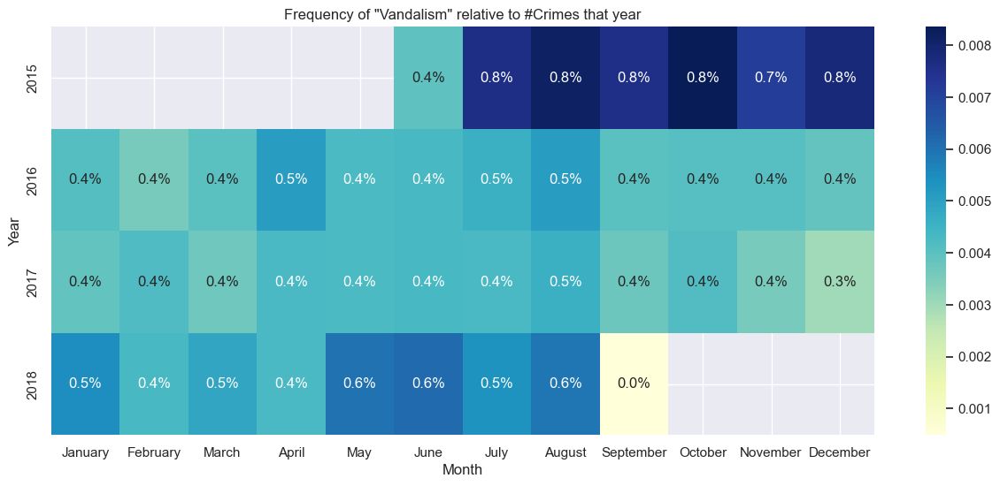

In [109]:
mv_accidents = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Vandalism']

mv_accidents['Year'] = mv_accidents['OCCURRED_ON_DATE'].dt.year
mv_accidents['Month'] = mv_accidents['OCCURRED_ON_DATE'].dt.month_name()
mv_accidents_year_month = mv_accidents.groupby(['Year', 'Month']).size()


total_crimes_per_year = crimes.groupby(crimes['OCCURRED_ON_DATE'].dt.year).size()


relative_frequency = mv_accidents_year_month.div(total_crimes_per_year, level='Year')
relative_frequency_unstacked = relative_frequency.unstack()

months_ordered = ['January', 'February', 'March', 'April', 'May', 'June',
                  'July', 'August', 'September', 'October', 'November', 'December']
relative_frequency_unstacked = relative_frequency_unstacked.reindex(columns=months_ordered)

plt.figure(figsize=(15, 6))
sns.heatmap(relative_frequency_unstacked, cmap="YlGnBu", annot=True, fmt=".3f")
plt.title('Frequency of "Vandalism" relative to #Crimes that year')
plt.xlabel('Month')
plt.ylabel('Year')


for t in plt.gca().texts:
    current_text = float(t.get_text()) * 100  # Convert to percentage
    t.set_text(f"{current_text:.1f}%")

plt.show()

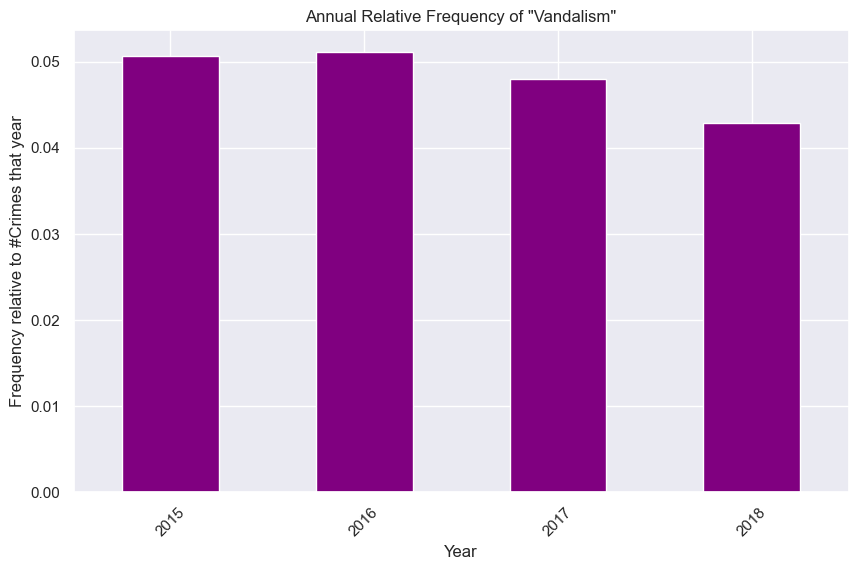

In [110]:
mv_accidents_annual = mv_accidents.groupby('Year').size()

# Calculating the total count of crimes per year
total_crimes_annual = crimes.groupby(crimes['OCCURRED_ON_DATE'].dt.year).size()

# Calculating the relative frequency of incidents for each year
relative_frequency_annual = mv_accidents_annual.div(total_crimes_annual, level='Year')

# Creating a barplot for the relative frequency
plt.figure(figsize=(10, 6))
(relative_frequency_annual).plot(kind='bar',  color='purple') 
plt.title('Annual Relative Frequency of "Vandalism"')
plt.xlabel('Year')
plt.ylabel('Frequency relative to #Crimes that year')
plt.xticks(rotation=45)
plt.show()

Let's analyze the weekly frequency:

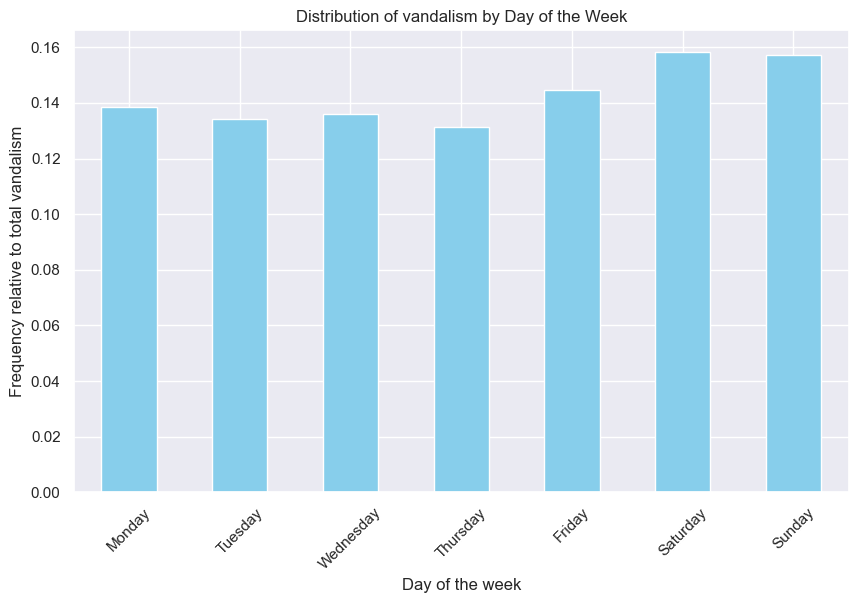

In [85]:
crimes_by_day = crimes['DAY_OF_WEEK'].value_counts()

mv_accidents_dayofweek = mv_accidents.groupby('DAY_OF_WEEK').size() / mv_accidents.groupby('DAY_OF_WEEK').size().sum()

days_ordered = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
mv_accidents_dayofweek = mv_accidents_dayofweek.reindex(days_ordered)

plt.figure(figsize=(10, 6))
mv_accidents_dayofweek.plot(kind='bar', color='skyblue')
plt.title('Distribution of vandalism by Day of the Week')
plt.xlabel('Day of the week')
plt.ylabel('Frequency relative to total vandalism')
plt.xticks(rotation=45)
plt.show()

Let's analyse the hourly frequency:

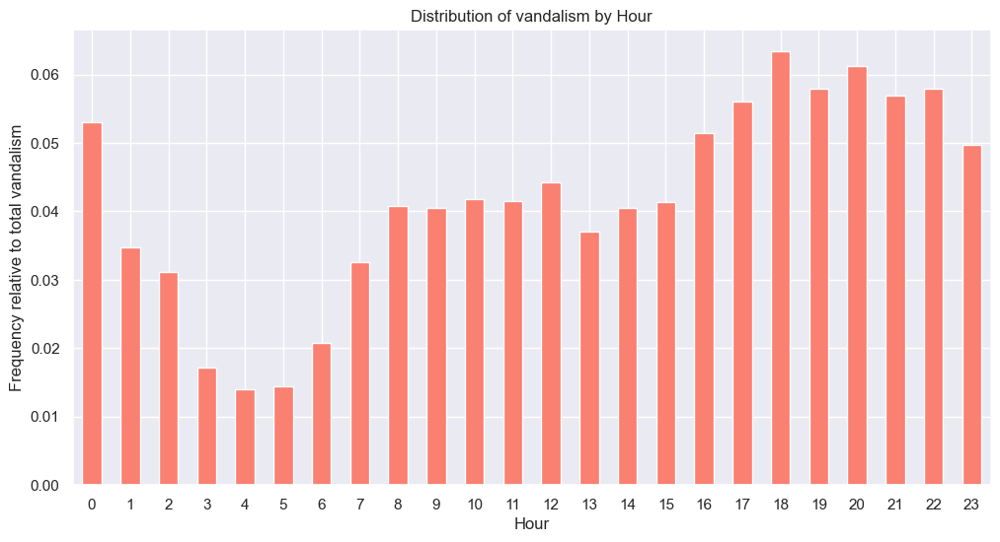

In [87]:
mv_accidents_hour = mv_accidents.groupby('HOUR').size() / mv_accidents.groupby('HOUR').size().sum()

plt.figure(figsize=(12, 6))
mv_accidents_hour.plot(kind='bar', color='salmon')
plt.title('Distribution of vandalism by Hour')
plt.xlabel('Hour')
plt.ylabel('Frequency relative to total vandalism')
plt.xticks(rotation=0)
plt.show()

Let's switch to the analysis of **Drug Crime**.   

Where is vandalism more spread out, which is its distribution? We start by seeing where they are located in the city:

In [ ]:
Drug = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Drug Violation']

# Drop any rows without latitude or longitude
Drug = Drug.dropna(subset=['Lat', 'Long'])

# Create a map centered at Boston (coordinates found online)
map_center = [42.356145,-71.064083]
crime_map = folium.Map(location=map_center, zoom_start = 12, min_zoom=12, max_zoom=12)  # You can adjust zoom level

# Create a Heatmap layer with adjusted parameters for transparency and detail
heat_data = [[row['Lat'], row['Long']] for index, row in Drug.iterrows()]
HeatMap(heat_data, radius=11).add_to(crime_map)  # Adjust radius, blur, opacity

# Create a custom legend as HTML
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            top: 50px; left: 50px; width: 120px; height: 100px; 
            border:2px solid grey; z-index:9999; font-size:14px; background:white;
            padding: 5px; border-radius: 3px; display: flex; align-items: center;">
    <div style="background: linear-gradient(to top, red, yellow, green, lightblue); 
                width: 20px; height: 50px; margin-right: 5px;"></div>
    <div>
        <div style="color: #333; font-size: 12px; text-align: left; margin-bottom: 30px; font-weight: bold;">
            Low Density
        </div>
        <div style="color: #333; font-size: 12px; text-align: left; font-weight: bold;">
            High Density
        </div>
    </div>
</div>
{% endmacro %}
"""

# Add the legend to the map
macro = MacroElement()
macro._template = Template(template)
crime_map.get_root().add_child(macro)

crime_map

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\3339994839.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\3339994839.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



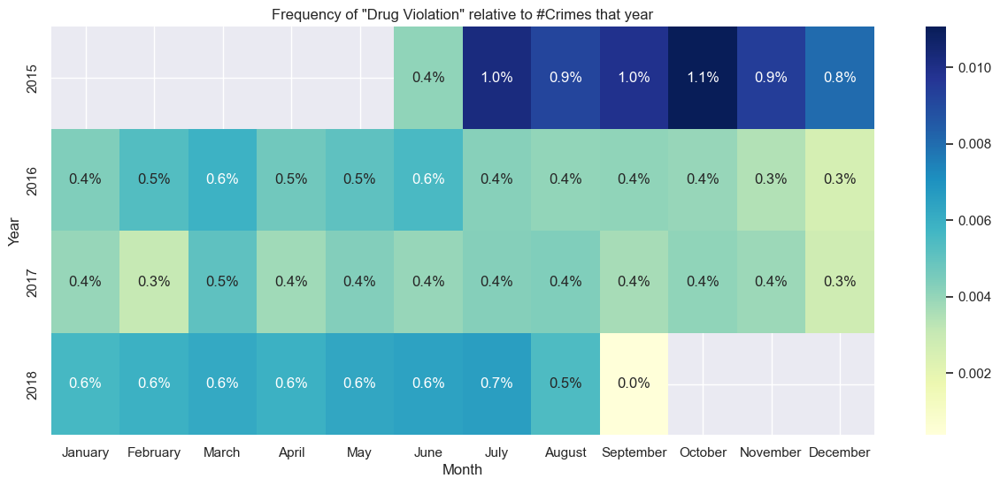

In [111]:
mv_accidents = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Drug Violation']

mv_accidents['Year'] = mv_accidents['OCCURRED_ON_DATE'].dt.year
mv_accidents['Month'] = mv_accidents['OCCURRED_ON_DATE'].dt.month_name()


mv_accidents_year_month = mv_accidents.groupby(['Year', 'Month']).size()


total_crimes_per_year = crimes.groupby(crimes['OCCURRED_ON_DATE'].dt.year).size()


relative_frequency = mv_accidents_year_month.div(total_crimes_per_year, level='Year')
relative_frequency_unstacked = relative_frequency.unstack()

months_ordered = ['January', 'February', 'March', 'April', 'May', 'June',
                  'July', 'August', 'September', 'October', 'November', 'December']
relative_frequency_unstacked = relative_frequency_unstacked.reindex(columns=months_ordered)

plt.figure(figsize=(15, 6))
sns.heatmap(relative_frequency_unstacked, cmap="YlGnBu", annot=True, fmt=".3f")
plt.title('Frequency of "Drug Violation" relative to #Crimes that year')
plt.xlabel('Month')
plt.ylabel('Year')


for t in plt.gca().texts:
    current_text = float(t.get_text()) * 100  # Convert to percentage
    t.set_text(f"{current_text:.1f}%")

plt.show()

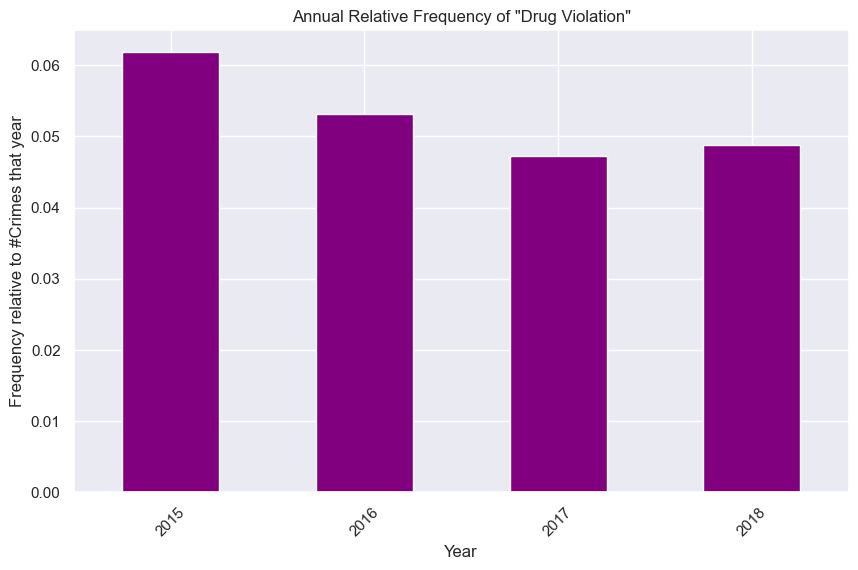

In [112]:
mv_accidents_annual = mv_accidents.groupby('Year').size()

# Calculating the total count of crimes per year
total_crimes_annual = crimes.groupby(crimes['OCCURRED_ON_DATE'].dt.year).size()

# Calculating the relative frequency of incidents for each year
relative_frequency_annual = mv_accidents_annual.div(total_crimes_annual, level='Year')

# Creating a barplot for the relative frequency
plt.figure(figsize=(10, 6))
(relative_frequency_annual).plot(kind='bar',  color='purple') 
plt.title('Annual Relative Frequency of "Drug Violation"')
plt.xlabel('Year')
plt.ylabel('Frequency relative to #Crimes that year')
plt.xticks(rotation=45)
plt.show()

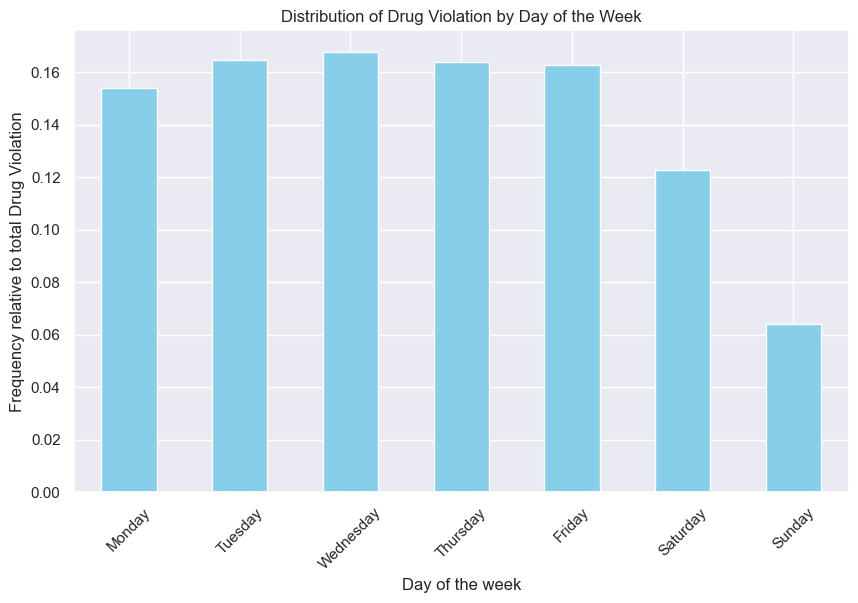

In [113]:
crimes_by_day = crimes['DAY_OF_WEEK'].value_counts()

mv_accidents_dayofweek = mv_accidents.groupby('DAY_OF_WEEK').size() / mv_accidents.groupby('DAY_OF_WEEK').size().sum()

days_ordered = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
mv_accidents_dayofweek = mv_accidents_dayofweek.reindex(days_ordered)

plt.figure(figsize=(10, 6))
mv_accidents_dayofweek.plot(kind='bar', color='skyblue')
plt.title('Distribution of Drug Violation by Day of the Week')
plt.xlabel('Day of the week')
plt.ylabel('Frequency relative to total Drug Violation')
plt.xticks(rotation=45)
plt.show()

Let's analyze the houtly frequency:

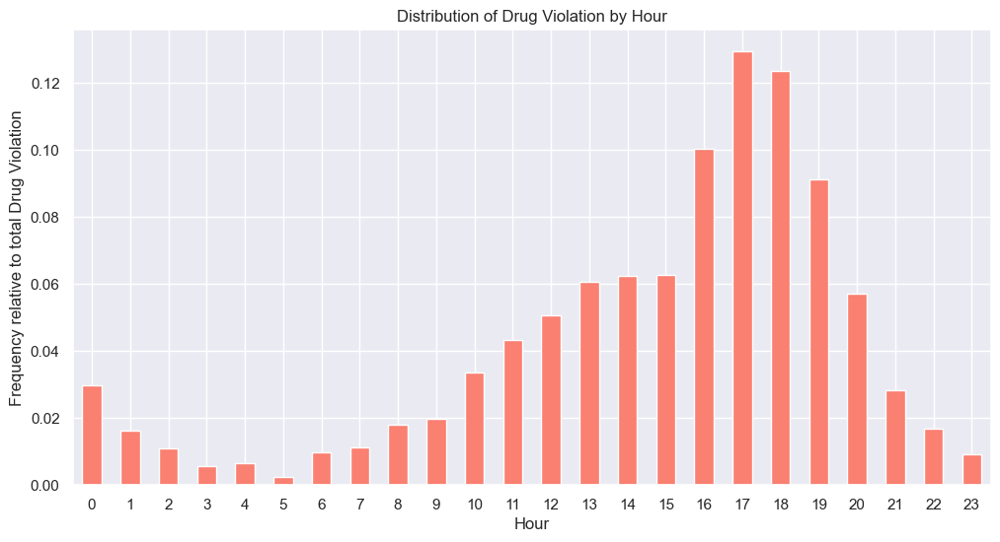

In [96]:
mv_accidents_hour = mv_accidents.groupby('HOUR').size() / mv_accidents.groupby('HOUR').size().sum()

plt.figure(figsize=(12, 6))
mv_accidents_hour.plot(kind='bar', color='salmon')
plt.title('Distribution of Drug Violation by Hour')
plt.xlabel('Hour')
plt.ylabel('Frequency relative to total Drug Violation')
plt.xticks(rotation=0)
plt.show()

Let's switch to the analysis of **Prostitution**.   

Where is vandalism more spread out, which is its distribution? We start by seeing where they are located in the city:

In [ ]:
Prostitution = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Prostitution']

# Drop any rows without latitude or longitude
Prostitution = Prostitution.dropna(subset=['Lat', 'Long'])

# Create a map centered at Boston (coordinates found online)
map_center = [42.356145,-71.064083]
crime_map = folium.Map(location=map_center, zoom_start = 12, min_zoom=12, max_zoom=12)  # You can adjust zoom level

# Create a Heatmap layer with adjusted parameters for transparency and detail
heat_data = [[row['Lat'], row['Long']] for index, row in Prostitution.iterrows()]
HeatMap(heat_data, radius=11).add_to(crime_map)  # Adjust radius, blur, opacity

# Create a custom legend as HTML
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            top: 50px; left: 50px; width: 120px; height: 100px; 
            border:2px solid grey; z-index:9999; font-size:14px; background:white;
            padding: 5px; border-radius: 3px; display: flex; align-items: center;">
    <div style="background: linear-gradient(to top, red, yellow, green, lightblue); 
                width: 20px; height: 50px; margin-right: 5px;"></div>
    <div>
        <div style="color: #333; font-size: 12px; text-align: left; margin-bottom: 30px; font-weight: bold;">
            Low Density
        </div>
        <div style="color: #333; font-size: 12px; text-align: left; font-weight: bold;">
            High Density
        </div>
    </div>
</div>
{% endmacro %}
"""

# Add the legend to the map
macro = MacroElement()
macro._template = Template(template)
crime_map.get_root().add_child(macro)

crime_map

Since they are very few there we will plot absolute values

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\3658909512.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\3658909512.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



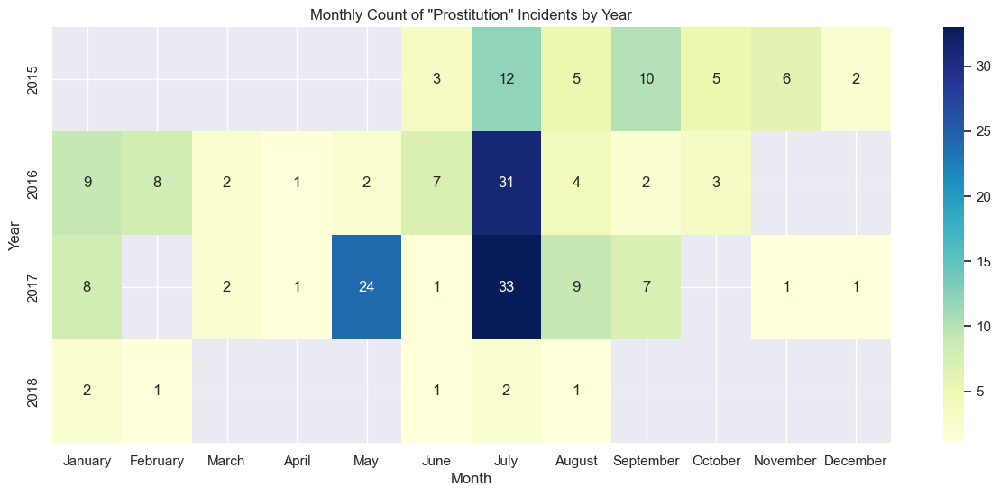

In [114]:
mv_accidents = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Prostitution']

mv_accidents['Year'] = mv_accidents['OCCURRED_ON_DATE'].dt.year
mv_accidents['Month'] = mv_accidents['OCCURRED_ON_DATE'].dt.month_name()
mv_accidents_year_month_count = mv_accidents.groupby(['Year', 'Month']).size()
mv_accidents_year_month_count_unstacked = mv_accidents_year_month_count.unstack()
months_ordered = ['January', 'February', 'March', 'April', 'May', 'June',
                  'July', 'August', 'September', 'October', 'November', 'December']
mv_accidents_year_month_count_unstacked = mv_accidents_year_month_count_unstacked.reindex(columns=months_ordered)

plt.figure(figsize=(15, 6))
sns.heatmap(mv_accidents_year_month_count_unstacked, cmap="YlGnBu", annot=True, fmt=".0f")
plt.title('Monthly Count of "Prostitution" Incidents by Year')
plt.xlabel('Month')
plt.ylabel('Year')
plt.show()

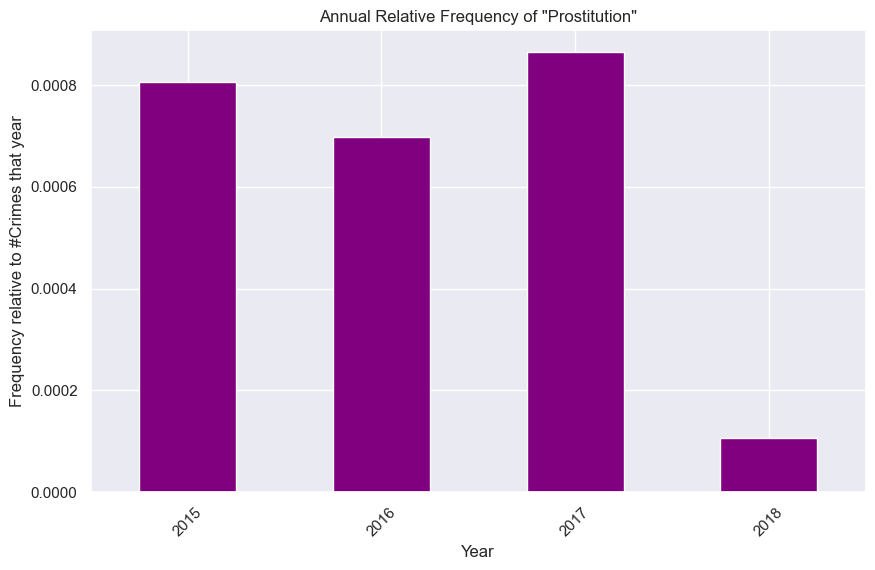

In [115]:
mv_accidents_annual = mv_accidents.groupby('Year').size()

# Calculating the total count of crimes per year
total_crimes_annual = crimes.groupby(crimes['OCCURRED_ON_DATE'].dt.year).size()

# Calculating the relative frequency of incidents for each year
relative_frequency_annual = mv_accidents_annual.div(total_crimes_annual, level='Year')

# Creating a barplot for the relative frequency
plt.figure(figsize=(10, 6))
(relative_frequency_annual).plot(kind='bar',  color='purple') 
plt.title('Annual Relative Frequency of "Prostitution"')
plt.xlabel('Year')
plt.ylabel('Frequency relative to #Crimes that year')
plt.xticks(rotation=45)
plt.show()

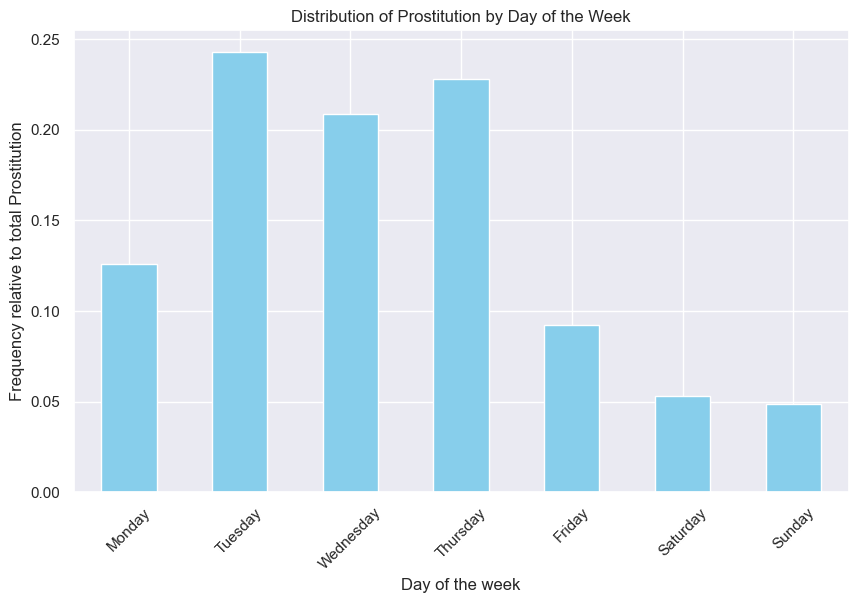

In [116]:
crimes_by_day = crimes['DAY_OF_WEEK'].value_counts()

mv_accidents_dayofweek = mv_accidents.groupby('DAY_OF_WEEK').size() / mv_accidents.groupby('DAY_OF_WEEK').size().sum()

days_ordered = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
mv_accidents_dayofweek = mv_accidents_dayofweek.reindex(days_ordered)

plt.figure(figsize=(10, 6))
mv_accidents_dayofweek.plot(kind='bar', color='skyblue')
plt.title('Distribution of Prostitution by Day of the Week')
plt.xlabel('Day of the week')
plt.ylabel('Frequency relative to total Prostitution')
plt.xticks(rotation=45)
plt.show()

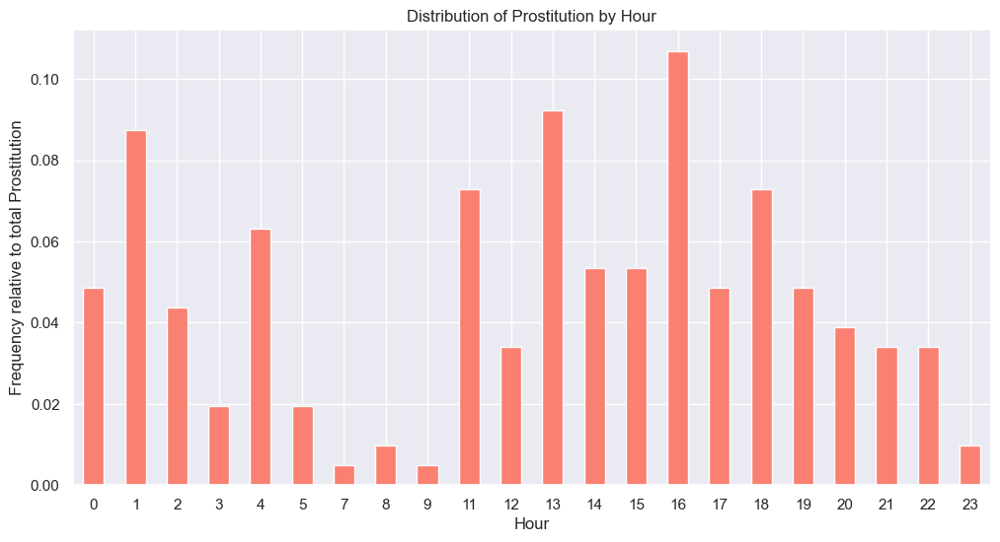

In [117]:
mv_accidents_hour = mv_accidents.groupby('HOUR').size() / mv_accidents.groupby('HOUR').size().sum()

plt.figure(figsize=(12, 6))
mv_accidents_hour.plot(kind='bar', color='salmon')
plt.title('Distribution of Prostitution by Hour')
plt.xlabel('Hour')
plt.ylabel('Frequency relative to total Prostitution')
plt.xticks(rotation=0)
plt.show()

Let's switch to the analysis of **Homicide**.   

In [ ]:
Homicide = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Homicide']

# Drop any rows without latitude or longitude
Homicide = Homicide.dropna(subset=['Lat', 'Long'])

# Create a map centered at Boston (coordinates found online)
map_center = [42.356145,-71.064083]
crime_map = folium.Map(location=map_center, zoom_start = 12, min_zoom=12, max_zoom=12)  # You can adjust zoom level

# Create a Heatmap layer with adjusted parameters for transparency and detail
heat_data = [[row['Lat'], row['Long']] for index, row in Homicide.iterrows()]
HeatMap(heat_data, radius=11).add_to(crime_map)  # Adjust radius, blur, opacity

# Create a custom legend as HTML
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            top: 50px; left: 50px; width: 120px; height: 100px; 
            border:2px solid grey; z-index:9999; font-size:14px; background:white;
            padding: 5px; border-radius: 3px; display: flex; align-items: center;">
    <div style="background: linear-gradient(to top, red, yellow, green, lightblue); 
                width: 20px; height: 50px; margin-right: 5px;"></div>
    <div>
        <div style="color: #333; font-size: 12px; text-align: left; margin-bottom: 30px; font-weight: bold;">
            Low Density
        </div>
        <div style="color: #333; font-size: 12px; text-align: left; font-weight: bold;">
            High Density
        </div>
    </div>
</div>
{% endmacro %}
"""

# Add the legend to the map
macro = MacroElement()
macro._template = Template(template)
crime_map.get_root().add_child(macro)

crime_map

Since they are very few there we will plot absolute values

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\3418359124.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andre\AppData\Local\Temp\ipykernel_29016\3418359124.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



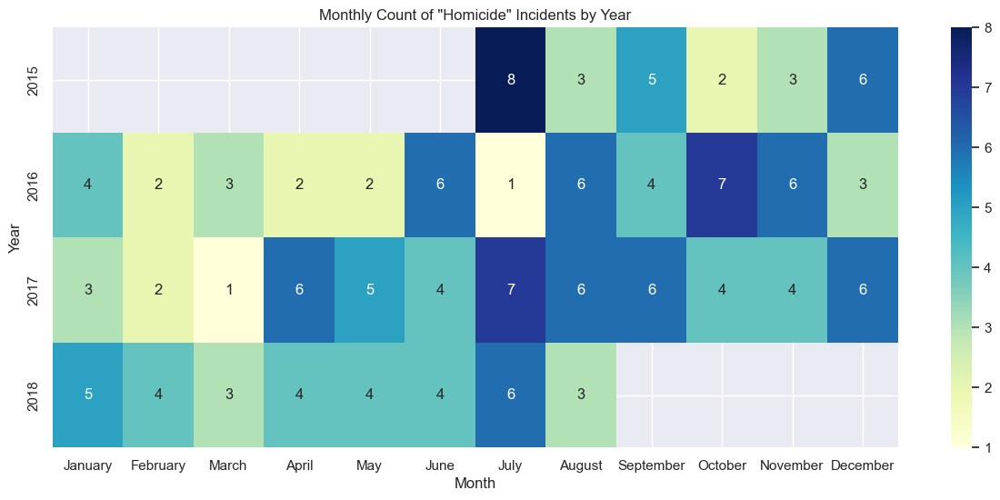

In [118]:
mv_accidents = crimes[crimes['OFFENSE_CODE_GROUP'] == 'Homicide']
mv_accidents['Year'] = mv_accidents['OCCURRED_ON_DATE'].dt.year
mv_accidents['Month'] = mv_accidents['OCCURRED_ON_DATE'].dt.month_name()

# Calculating the monthly count of 'Homicide' incidents for each year
mv_accidents_year_month_count = mv_accidents.groupby(['Year', 'Month']).size()

# Reshaping for the heatmap
mv_accidents_year_month_count_unstacked = mv_accidents_year_month_count.unstack()

# Ordering months
months_ordered = ['January', 'February', 'March', 'April', 'May', 'June',
                  'July', 'August', 'September', 'October', 'November', 'December']
mv_accidents_year_month_count_unstacked = mv_accidents_year_month_count_unstacked.reindex(columns=months_ordered)

plt.figure(figsize=(15, 6))
sns.heatmap(mv_accidents_year_month_count_unstacked, cmap="YlGnBu", annot=True, fmt=".0f")
plt.title('Monthly Count of "Homicide" Incidents by Year')
plt.xlabel('Month')
plt.ylabel('Year')
plt.show()

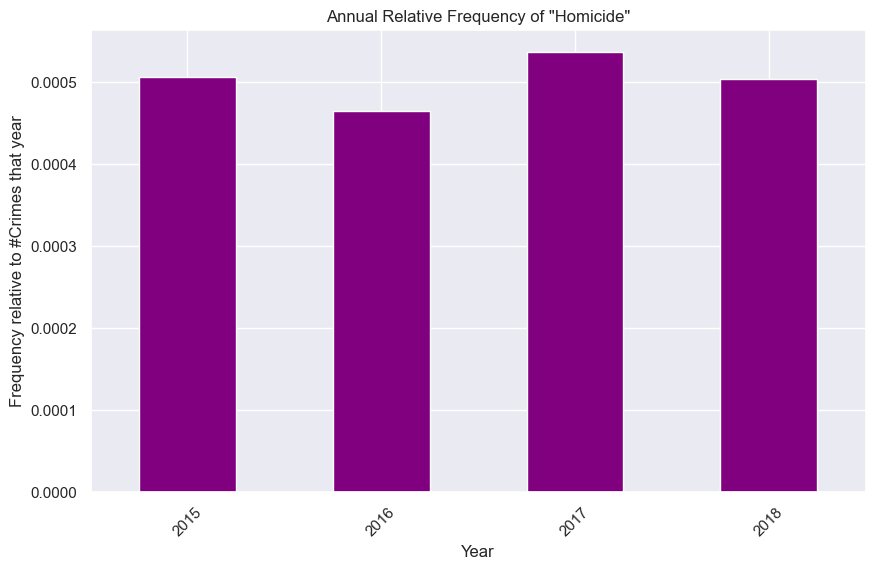

In [119]:
mv_accidents_annual = mv_accidents.groupby('Year').size()

# Calculating the total count of crimes per year
total_crimes_annual = crimes.groupby(crimes['OCCURRED_ON_DATE'].dt.year).size()

# Calculating the relative frequency of incidents for each year
relative_frequency_annual = mv_accidents_annual.div(total_crimes_annual, level='Year')

# Creating a barplot for the relative frequency
plt.figure(figsize=(10, 6))
(relative_frequency_annual).plot(kind='bar',  color='purple') 
plt.title('Annual Relative Frequency of "Homicide"')
plt.xlabel('Year')
plt.ylabel('Frequency relative to #Crimes that year')
plt.xticks(rotation=45)
plt.show()

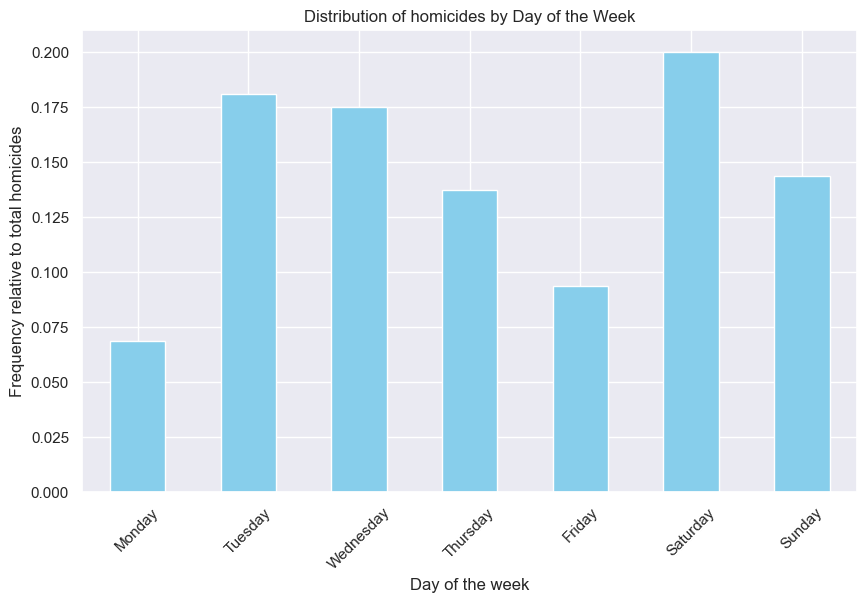

In [120]:
crimes_by_day = crimes['DAY_OF_WEEK'].value_counts()

mv_accidents_dayofweek = mv_accidents.groupby('DAY_OF_WEEK').size() / mv_accidents.groupby('DAY_OF_WEEK').size().sum()

days_ordered = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
mv_accidents_dayofweek = mv_accidents_dayofweek.reindex(days_ordered)

plt.figure(figsize=(10, 6))
mv_accidents_dayofweek.plot(kind='bar', color='skyblue')
plt.title('Distribution of homicides by Day of the Week')
plt.xlabel('Day of the week')
plt.ylabel('Frequency relative to total homicides')
plt.xticks(rotation=45)
plt.show()

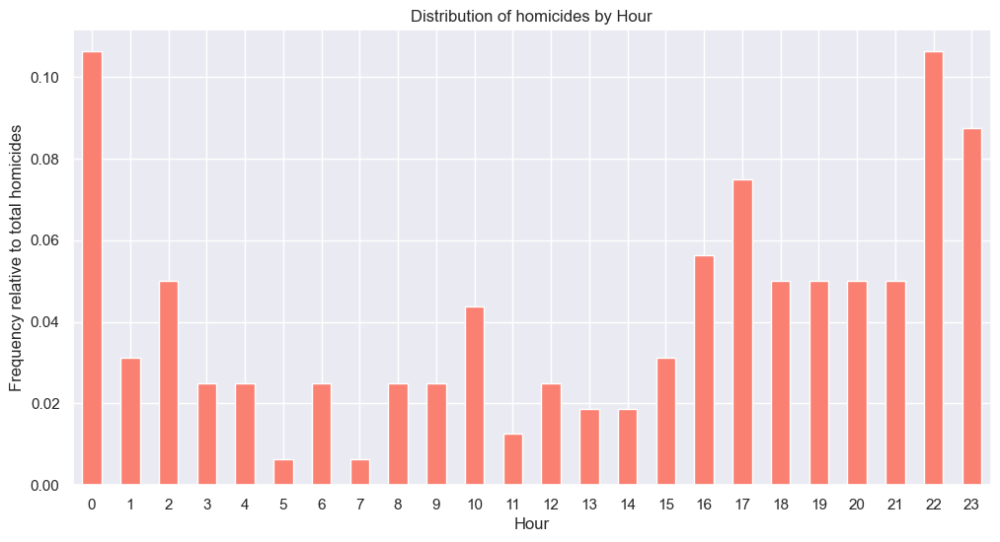

In [121]:
mv_accidents_hour = mv_accidents.groupby('HOUR').size() / mv_accidents.groupby('HOUR').size().sum()

plt.figure(figsize=(12, 6))
mv_accidents_hour.plot(kind='bar', color='salmon')
plt.title('Distribution of homicides by Hour')
plt.xlabel('Hour')
plt.ylabel('Frequency relative to total homicides')
plt.xticks(rotation=0)
plt.show()

It has to be mentioned that this analysis is only a starting point for further investigation. The analysis has to be combined with the socioeconomic, demographic, and cultural context in which these events occur. Without additional data on population, income levels, education, unemployment rates and other socio-economic factors, it becomes difficult to draw accurate conclusions about the origin or causes of crimes. In addition, detailed demographic data, such as the age and gender of those involved in crimes, could offer additional keys to better understanding the crime landscape. 